In [3]:
import pandas as pd
import numpy as np
import os
import pickle
import torch
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import glob
import significantdigits as sig
import matplotlib.image as mpimg
import glob
from IPython.display import display
from IPython.display import Image as Im
from PIL import Image
from matplotlib.colors import LogNorm, Normalize
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import TwoSlopeNorm
from matplotlib.colors import LinearSegmentedColormap


### Utility Functions

In [ ]:
def analyze_embeddings(block_layers, embed_dir, colormap, dict_type=True, v2=False, std_vmin=None, std_vmax=None, mean_vmin=None, mean_vmax=None):
    layers = {}

    for embed in block_layers:
        # print(embed)
        layers[embed] = []
        if v2: 
            embedv2 = f"{embed}_?.pkl"
        else:
            embedv2 = f"{embed}_*"
        for file in glob.glob(f'{embed_dir}/*{embedv2}'):
            if dict_type: 
                if embed == 'unpool':
                    layers[embed].append(pickle.load(open(file, 'rb'))[embed].squeeze())
                else:
                    layers[embed].append(pickle.load(open(file, 'rb'))[embed].numpy().squeeze())
            else:
                if embed == 'unpool':
                    layers[embed].append(pickle.load(open(file, 'rb')).squeeze())
                else:
                    layers[embed].append(pickle.load(open(file, 'rb')).numpy().squeeze())

        layers[embed] = np.array(layers[embed], dtype=np.float64)

        # print(layers[embed].shape)

    for embed in block_layers:
        fig, axes = plt.subplots(1, 3, figsize=(20,5))
        # print(embed)

        layer_sig = sig.significant_digits(layers[embed], reference=np.mean(layers[embed], axis=0, dtype=np.float64), method=sig.Method.CNH, basis=10, dtype=np.float64)
        # print(layer_sig.shape)
        gc = sns.heatmap(np.mean(layer_sig, axis=0, dtype=np.float64), ax=axes[0], vmin=0, vmax=7, cmap='RdYlGn', cbar=False)
        # gc.axes.get_yaxis().set_visible(False), gc.axes.get_xaxis().set_visible(False)
        gc.set_title(f"Significant Digits\nMax: {np.max(layer_sig):.2f} and Min: {np.min(layer_sig):.2f}")
        gc.set_yticks([]), gc.set_xticks([])
        # fig.axes.get_xaxis().set_visible(False)
        # fig.axes.get_yaxis().set_visible(False)
        
        layer_std = np.std(layers[embed], axis=0,dtype=np.float64)
        layer_std = np.mean(layer_std, axis=0,dtype=np.float64)
        # layer_std = np.where(layer_std ==0, 0, np.log10(layer_std))
        if std_vmax:
            gc = sns.heatmap(layer_std, ax=axes[1], vmin=std_vmin, vmax=std_vmax, cmap=colormap, norm=LogNorm(vmin=std_vmin, vmax=std_vmax), cbar=False)
        else:
            gc = sns.heatmap(layer_std, ax=axes[1], cmap=colormap, cbar=False)

        # gc.axes.get_yaxis().set_visible(False), gc.axes.get_xaxis().set_visible(False)
        gc.set_title(f"Standard Deviation\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");
        gc.set_yticks([]), gc.set_xticks([])

        layer_mean = np.mean(layers[embed], axis=0,dtype=np.float64)
        norm = TwoSlopeNorm(vmin=layer_mean.min()/2, vcenter=0, vmax=layer_mean.max()/2)

        if mean_vmin:
            norm = TwoSlopeNorm(vmin=mean_vmin, vcenter=0, vmax=mean_vmax)
            gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes[2], vmin=mean_vmin, vmax=mean_vmax, norm=norm, cmap='twilight', cbar=False)
        else:
            gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes[2], norm=norm, cmap='twilight', cbar=False)

        
        # gc.axes.get_yaxis().set_visible(False), gc.axes.get_xaxis().set_visible(False)
        gc.set_title(f"Mean\nMax: {np.max(layer_mean):.2f} and Min: {np.min(layer_mean):.2f}");
        gc.set_yticks([]), gc.set_xticks([])

        plt.suptitle(f"{embed}\n", y=1.02, fontsize=15);
        # break

In [ ]:
def embed_colorbar(block_layers, embed_dir, colormap, dict_type=True, v2=False, std_vmin=None, std_vmax=None, mean_vmin=None, mean_vmax=None, plot_type='sig'):
    layers = {}

    for embed in block_layers:
        # print(embed)
        layers[embed] = []
        if v2: 
            embedv2 = f"{embed}_?.pkl"
        else:
            embedv2 = f"{embed}_*"
        for file in glob.glob(f'{embed_dir}/*{embedv2}'):
            if dict_type: 
                if embed == 'unpool':
                    layers[embed].append(pickle.load(open(file, 'rb'))[embed].squeeze())
                else:
                    layers[embed].append(pickle.load(open(file, 'rb'))[embed].numpy().squeeze())
            else:
                if embed == 'unpool':
                    layers[embed].append(pickle.load(open(file, 'rb')).squeeze())
                else:
                    layers[embed].append(pickle.load(open(file, 'rb')).numpy().squeeze())

        layers[embed] = np.array(layers[embed], dtype=np.float64)

        # print(layers[embed].shape)

    for embed in block_layers:
        fig, axes = plt.subplots(1, 1, figsize=(20,5))
        # print(embed)

        if plot_type == 'sig':

            layer_sig = sig.significant_digits(layers[embed], reference=np.mean(layers[embed], axis=0, dtype=np.float64), method=sig.Method.CNH, basis=10, dtype=np.float64)
            # print(layer_sig.shape)
            gc = sns.heatmap(np.mean(layer_sig, axis=0, dtype=np.float64), ax=axes, vmin=0, vmax=7, cmap='RdYlGn', cbar=True, cbar_kws={"orientation": "horizontal"})
            # gc.axes.get_yaxis().set_visible(False), gc.axes.get_xaxis().set_visible(False)
            gc.set_title(f"Significant Digits\nMax: {np.max(layer_sig):.2f} and Min: {np.min(layer_sig):.2f}")
            gc.set_yticks([]), gc.set_xticks([])

        elif plot_type == 'std':

            layer_std = np.std(layers[embed], axis=0,dtype=np.float64)
            layer_std = np.mean(layer_std, axis=0,dtype=np.float64)
            # layer_std = np.where(layer_std ==0, 0, np.log10(layer_std))
            if std_vmax:
                gc = sns.heatmap(layer_std, ax=axes, vmin=std_vmin, vmax=std_vmax, cmap=colormap, norm=LogNorm(vmin=std_vmin, vmax=std_vmax), cbar=True, cbar_kws={"orientation": "horizontal"})
            else:
                gc = sns.heatmap(layer_std, ax=axes, cmap=colormap, cbar=True, cbar_kws={"orientation": "horizontal"})

            # gc.axes.get_yaxis().set_visible(False), gc.axes.get_xaxis().set_visible(False)
            gc.set_title(f"Standard Deviation\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");
            gc.set_yticks([]), gc.set_xticks([])

        elif plot_type == 'mean':

            layer_mean = np.mean(layers[embed], axis=0,dtype=np.float64)
            norm = TwoSlopeNorm(vmin=layer_mean.min()/2, vcenter=0, vmax=layer_mean.max()/2)

            if mean_vmin:
                norm = TwoSlopeNorm(vmin=mean_vmin, vcenter=0, vmax=mean_vmax)
                gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes, vmin=mean_vmin, vmax=mean_vmax, norm=norm, cmap='twilight', cbar=True, cbar_kws={"orientation": "horizontal"})
            else:
                gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes, norm=norm, cmap='twilight', cbar=True, cbar_kws={"orientation": "horizontal"})

            # gc.axes.get_yaxis().set_visible(False), gc.axes.get_xaxis().set_visible(False)
            gc.set_title(f"Mean\nMax: {np.max(layer_mean):.2f} and Min: {np.min(layer_mean):.2f}");
        
        cbar = gc.collections[0].colorbar
        cbar.ax.tick_params(labelsize=15)  # Set the size of the colorbar ticks
        cbar.set_label('Mean', size=20)  # Set the size of the colorbar label


        gc.set_yticks([]), gc.set_xticks([])




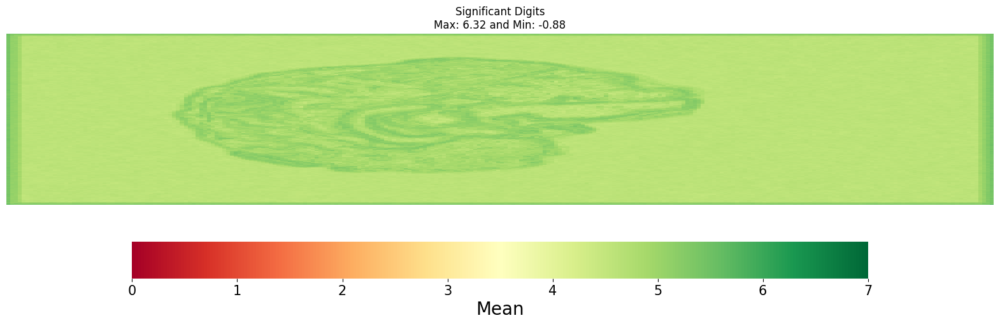

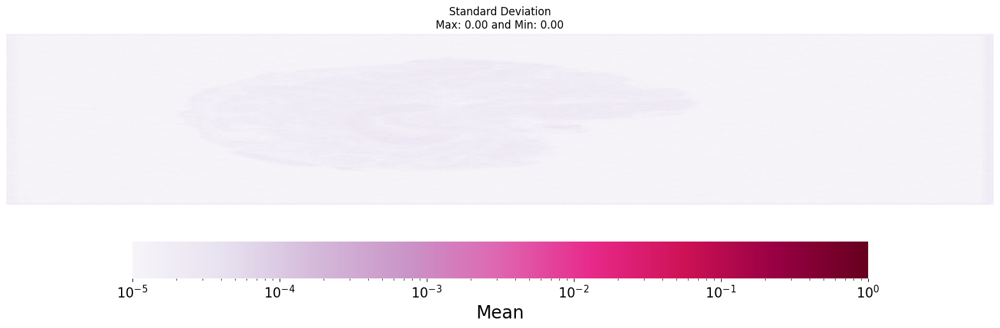

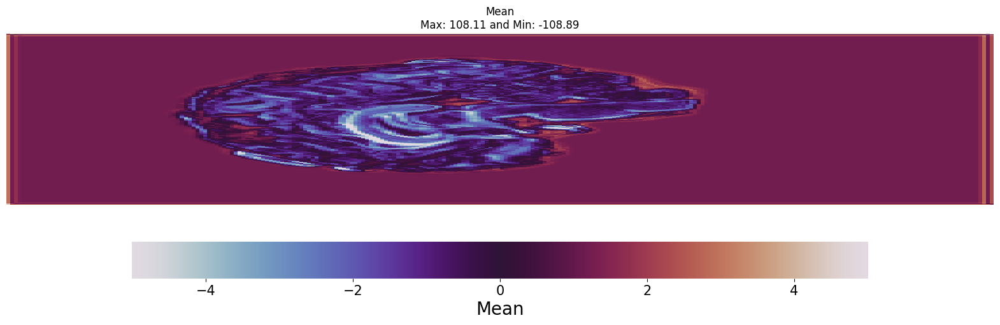

In [ ]:
embed_colorbar(['inp_block'], 
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_sagittal2/', dict_type=False, colormap='PuRd', std_vmax=1, std_vmin=10e-6, mean_vmin=-5, mean_vmax=5, plot_type='sig')

embed_colorbar(['inp_block'], 
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_sagittal2/', dict_type=False, colormap='PuRd', std_vmax=1, std_vmin=10e-6, mean_vmin=-5, mean_vmax=5, plot_type='std')

embed_colorbar(['inp_block'], 
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_sagittal2/', dict_type=False, colormap='PuRd', std_vmax=1, std_vmin=10e-6, mean_vmin=-5, mean_vmax=5, plot_type='mean')

In [ ]:
def make_gif(frame_folder, gif_name, duration, sort=True):
    files = glob.glob(f"{frame_folder}/*.png")
    # print(len(files))
    files = [x for x in files if not '0027393' in x and not '0026036' in x and not '0027434' in x]
    if 'freesurfer' in gif_name and 'seg' in gif_name:
        files = sorted(files)[:-2]
#     print(files)
        
    if sort:
        tmp = []
        for f in ['0025531', '0025350']:
            tmp.append([x for x in files if f in x][0])
        files=tmp
#     print(tmp)
        
    # print(len(files))
    frames = [Image.open(image) for image in files]
    frame_one = frames[0]
    frame_one.save(f"{gif_name}.gif", format="GIF", append_images=frames,
               save_all=True, duration=duration, loop=0)


#to get raw images open subjects in freeview and save image in different views
for view in ['axial', 'coronal', 'sagittal']:
    for sub in ['0025531', '0025350']:
        make_gif(f'raw_images/{sub}/{view}', f'raw_images/{sub}_{view}_gif', 300, False)


### Manual MaxUnpool -- found cause of Unpooling Noise

In [5]:
def max_unpooling(pooled_output, pool_mask, kernel_size, stride, padding):
    batch_size, num_channels, pooled_height, pooled_width = pooled_output.shape
    kernel_height, kernel_width = kernel_size
    stride_height, stride_width = stride

    # Calculate unpooled height and width
    unpooled_height = (pooled_height - 1) * stride_height + kernel_height - 2 * padding[0]
    unpooled_width = (pooled_width - 1) * stride_width + kernel_width - 2 * padding[1]

    inconsistencies = {'max_index': [], 'max_value': []}
    # Initialize unpooled output
    unpooled_output = np.zeros((batch_size, num_channels, unpooled_height, unpooled_width))
    # print(unpooled_output.shape)
    # Iterate over each element in the pooled output
    for b in range(batch_size):
        for c in [0]: #range(num_channels):
            for h in range(pooled_height):
                for w in range(pooled_width):
                    # Get the index of the maximum value from the pool mask
                    max_index = pool_mask[b, c, h, w]
                    if w == 15: 
                        inconsistencies['max_index'].append(max_index)
                        inconsistencies['max_value'].append( pooled_output[b, c, h, w] )

                    # Convert the 1D index to 2D coordinates in the original input
                    max_h = max_index // pooled_width
                    max_w = max_index % pooled_width

                    # Calculate the starting point in the unpooled output
                    start_h = h * stride_height - padding[0]
                    start_w = w * stride_width - padding[1]

                    # Calculate the end point in the unpooled output
                    end_h = start_h + kernel_height
                    end_w = start_w + kernel_width

                    # Update the unpooled output with the value from the pooled output
                    if (start_h >= 0) and (end_h <= unpooled_height) and (start_w >= 0) and (end_w <= unpooled_width):
                        indices = np.unravel_index(max_index, unpooled_output.shape, order='C')
                        unpooled_output[ indices[0], c, indices[2], indices[3] ] = pooled_output[b, c, h, w]
                    
    return unpooled_output, inconsistencies



# res = []
# outputs = []
# ind = []

# for i in range(1,11):
#     output = pickle.load(open(f'../../results/sub-0025531_sagittal2/bottleneck_{i}.pkl', 'rb'))
#     outputs.append(output)
#     indices = pickle.load(open(f'../../results/sub-0025531_indices/indices4_{i}.pkl', 'rb'))
#     ind.append(indices)
#     res.append(max_unpooling(output, indices, (2,2), (2,2),(0,0)))

# res = np.array(res)
# ind = np.array(ind)
# outputs = np.array(outputs)



##### Confirm Validity of Manual Unpooling

/home/ine5/jupyter_nb/lib/python3.10/site-packages/significantdigits/_significantdigits.py:257: RuntimeWarning: invalid value encountered in divide
  return operator(x, y_reshaped)


<Axes: >

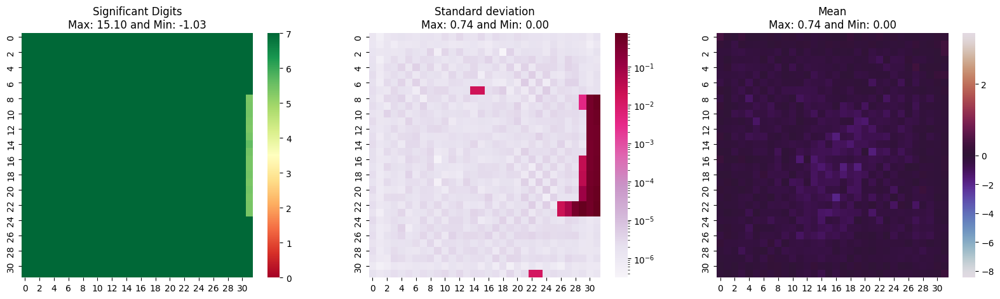

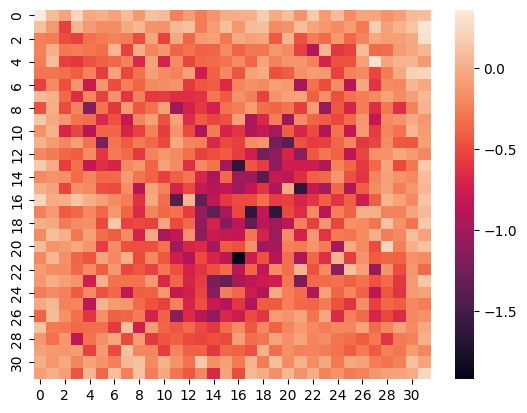

In [4]:
## real maxunpool
unpool_op = torch.nn.MaxUnpool2d(2, stride=2)
real_unpool_ieee = []
for i in range(1,11):
    output = pickle.load(open(f'../../results/sub-0025531_sagittal2/bottleneck_{i}.pkl', 'rb'))
    indices = pickle.load(open(f'../../results/sub-0025531_indices/indices4_{i}.pkl', 'rb'))
    real_unpool_ieee.append(unpool_op(output, indices))
real_unpool_ieee = np.array(real_unpool_ieee)


fig, axes = plt.subplots(1, 3, figsize=(20,5))

layer_sig = sig.significant_digits(real_unpool_ieee.squeeze(), reference=np.mean(res.squeeze(), axis=0, dtype=np.float64), method=sig.Method.CNH, basis=10, dtype=np.float64)
gc = sns.heatmap(np.mean(layer_sig, axis=0, dtype=np.float64), ax=axes[0], vmin=0, vmax=7, cmap='RdYlGn', cbar=True)
gc.set_title(f"Significant Digits\nMax: {np.max(layer_sig):.2f} and Min: {np.min(layer_sig):.2f}")

layer_std = np.std(real_unpool_ieee.squeeze(), axis=0,dtype=np.float64)
layer_std = np.mean(layer_std, axis=0,dtype=np.float64)
gc = sns.heatmap(layer_std, ax=axes[1], cmap='PuRd', norm=LogNorm(), cbar=True)
gc.set_title(f"Standard deviation\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");

layer_mean = np.mean(real_unpool_ieee.squeeze(), axis=0,dtype=np.float64)

norm = TwoSlopeNorm(vmin=layer_mean.min()+10, vcenter=0, vmax=layer_mean.max()-10)

gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes[2], norm=norm, cmap='twilight', cbar=True)
gc.set_title(f"Mean\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");

plt.figure()

sns.heatmap(np.mean(real_unpool_ieee[0].squeeze(), axis=0))

<Axes: >

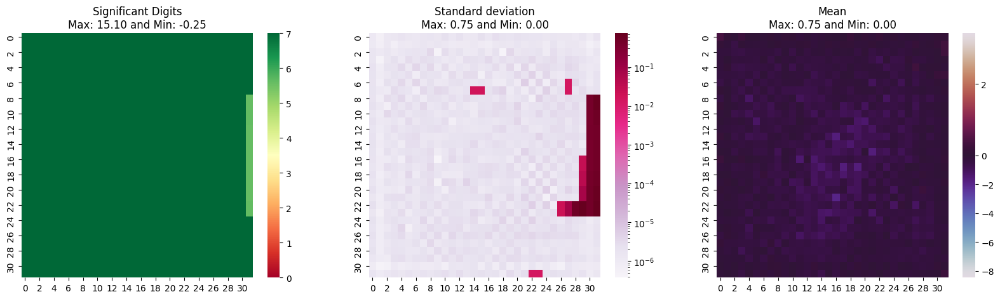

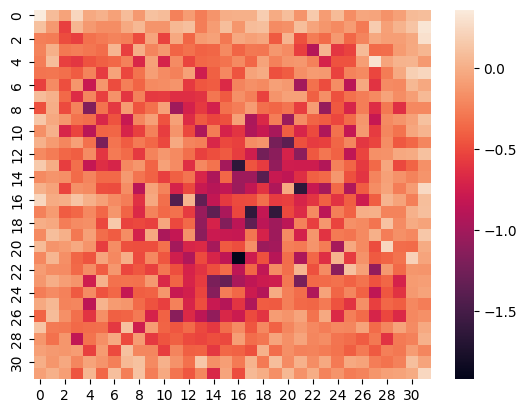

In [5]:
unpool = []
for i in range(1,11):
    unpool.append(pickle.load(open(f'../../results/sub-0025531_decode4_v2/outp_unpool_{i}.pkl', 'rb')))
unpool = np.array(unpool)

fig, axes = plt.subplots(1, 3, figsize=(20,5))

layer_sig = sig.significant_digits(unpool.squeeze(), reference=np.mean(res.squeeze(), axis=0, dtype=np.float64), method=sig.Method.CNH, basis=10, dtype=np.float64)
gc = sns.heatmap(np.mean(layer_sig, axis=0, dtype=np.float64), ax=axes[0], vmin=0, vmax=7, cmap='RdYlGn', cbar=True)
gc.set_title(f"Significant Digits\nMax: {np.max(layer_sig):.2f} and Min: {np.min(layer_sig):.2f}")

layer_std = np.std(unpool.squeeze(), axis=0,dtype=np.float64)
layer_std = np.mean(layer_std, axis=0,dtype=np.float64)
gc = sns.heatmap(layer_std, ax=axes[1], cmap='PuRd', norm=LogNorm(), cbar=True)
gc.set_title(f"Standard deviation\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");

layer_mean = np.mean(unpool.squeeze(), axis=0,dtype=np.float64)

norm = TwoSlopeNorm(vmin=layer_mean.min()+10, vcenter=0, vmax=layer_mean.max()-10)

gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes[2], norm=norm, cmap='twilight', cbar=True)
gc.set_title(f"Mean\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");

plt.figure()

sns.heatmap(np.mean(unpool[0].squeeze(), axis=0))

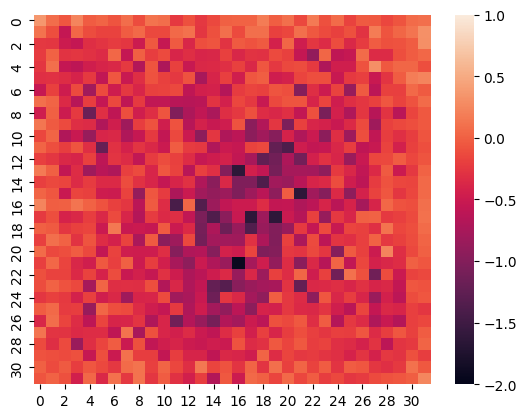

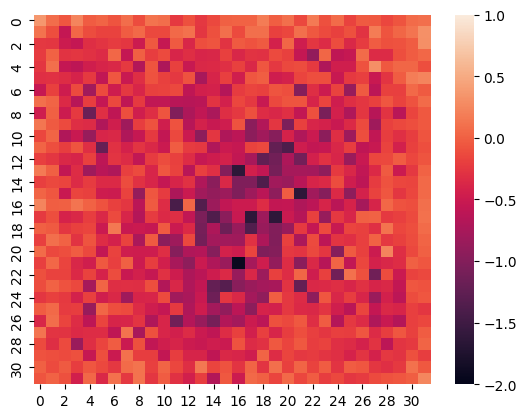

In [5]:
sns.heatmap(np.mean(np.mean(res.squeeze(), axis=0), axis=0), vmin=-2, vmax=1);
plt.figure()
sns.heatmap(np.mean(np.mean(real_unpool_ieee.squeeze(), axis=0), axis=0), vmin=-2, vmax=1);

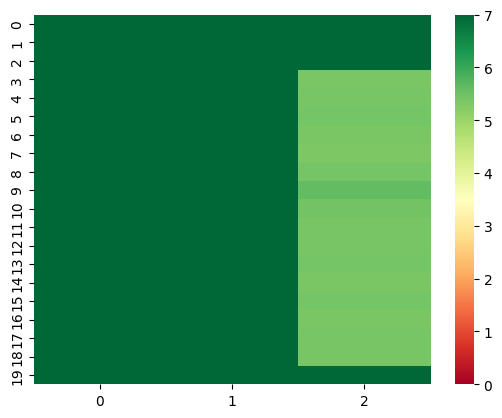

In [12]:
gc = sns.heatmap(np.mean(layer_sig, axis=0, dtype=np.float64)[5:25, 29:], vmin=0, vmax=7, cmap='RdYlGn', cbar=True)


/home/ine5/jupyter_nb/lib/python3.10/site-packages/significantdigits/_significantdigits.py:257: RuntimeWarning: invalid value encountered in divide
  return operator(x, y_reshaped)


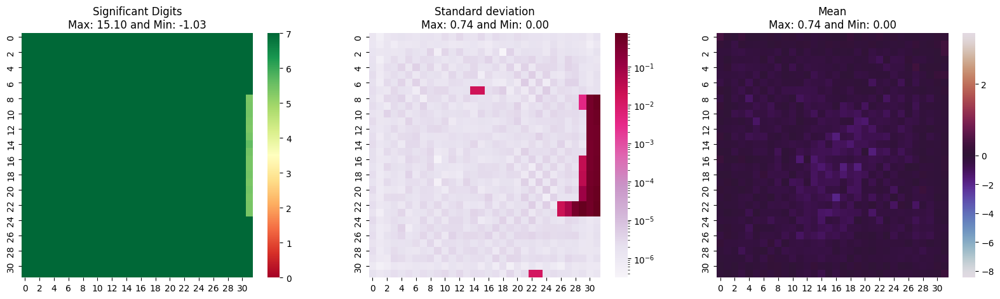

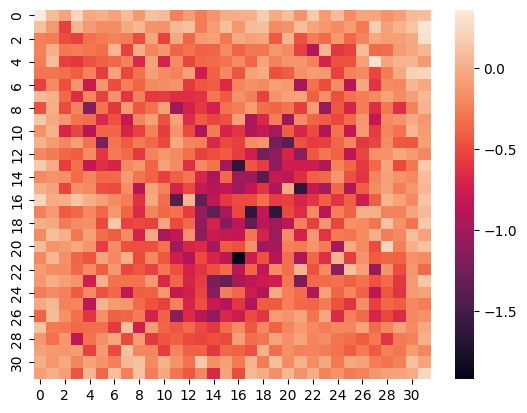

In [6]:
fig, axes = plt.subplots(1, 3, figsize=(20,5))

layer_sig = sig.significant_digits(res.squeeze(), reference=np.mean(res.squeeze(), axis=0, dtype=np.float64), method=sig.Method.CNH, basis=10, dtype=np.float64)
gc = sns.heatmap(np.mean(layer_sig, axis=0, dtype=np.float64), ax=axes[0], vmin=0, vmax=7, cmap='RdYlGn', cbar=True)
gc.set_title(f"Significant Digits\nMax: {np.max(layer_sig):.2f} and Min: {np.min(layer_sig):.2f}")

layer_std = np.std(res.squeeze(), axis=0,dtype=np.float64)
layer_std = np.mean(layer_std, axis=0,dtype=np.float64)
gc = sns.heatmap(layer_std, ax=axes[1], cmap='PuRd', norm=LogNorm(), cbar=True)
gc.set_title(f"Standard deviation\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");

layer_mean = np.mean(res.squeeze(), axis=0,dtype=np.float64)

norm = TwoSlopeNorm(vmin=layer_mean.min()+10, vcenter=0, vmax=layer_mean.max()-10)

gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes[2], norm=norm, cmap='twilight', cbar=True) #RdBu_r
gc.set_title(f"Mean\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");

plt.figure()

sns.heatmap(np.mean(res[0].squeeze(), axis=0));

## Exploring Variable Indices in Max Pooling

#### Testing for Repeating Indices -- None found

In [ ]:
for j in [1,2,3,4]:
    print(f'Indices {j}')
    for i in range(1,11):
        idx = pickle.load(open(f'/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_indices/indices{j}_{i}.pkl', 'rb'))
        # idx = pickle.load(open(f'/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_indices/indices4_3.pkl', 'rb'))
        for i in idx.squeeze():
            if np.unique(i.flatten()).shape != i.flatten().shape: print( np.unique(i.flatten()).shape , i.flatten().shape )
# np.unique(idx.reshape(71,-1), axis=0).shape, idx.shape

Indices 1
Indices 2
Indices 3
Indices 4


In [ ]:
for j in [1,2,3,4]:
    print(f'Indices {j}')
    for i in range(1,11):
        idx = pickle.load(open(f'/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_indices/indices{j}_{i}.pkl', 'rb'))
        print(idx.flatten().shape, np.unique(idx).shape, idx.squeeze().shape, np.unique(idx.squeeze(), axis=0).shape)
    # break

Indices 1
torch.Size([1163264]) (65481,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65475,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65476,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65475,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65475,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65476,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65478,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65478,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65476,) torch.Size([71, 128, 128]) (71, 128, 128)
torch.Size([1163264]) (65478,) torch.Size([71, 128, 128]) (71, 128, 128)
Indices 2
torch.Size([290816]) (16363,) torch.Size([71, 64, 64]) (71, 64, 64)
torch.Size([290816]) (16363,) torch.Size([71, 64, 64]) (71, 64, 64)
torch.Size([290816]) (16365,) torch.Size([71, 64, 64]) (71, 64, 64)
torch.Size([290816]) (16362,) torch.Size([71, 

### Identify What Causes Spot Instability

(10, 71, 128, 128)
(10, 71, 64, 64)
(10, 71, 32, 32)
(11, 71, 16, 16)


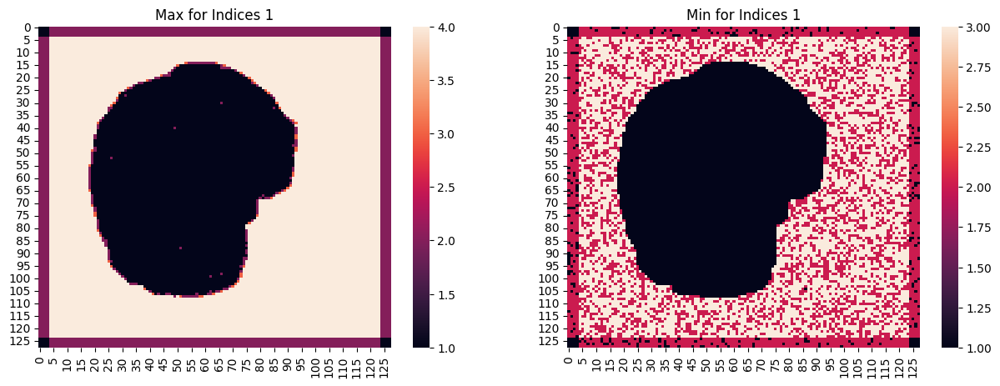

<Figure size 640x480 with 0 Axes>

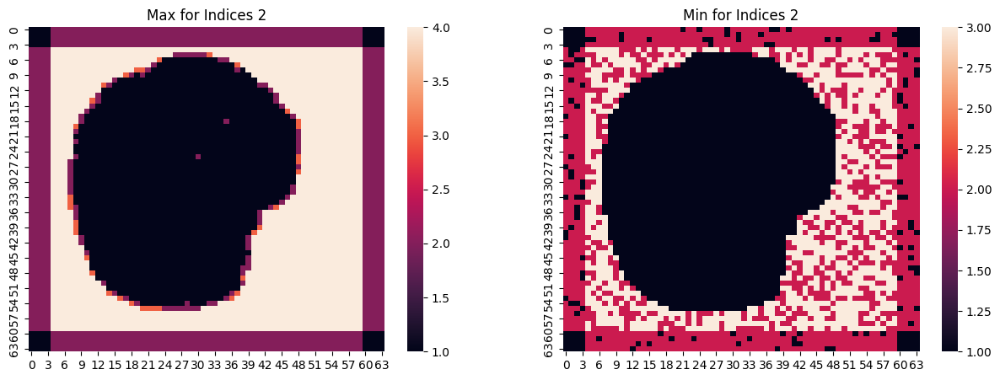

<Figure size 640x480 with 0 Axes>

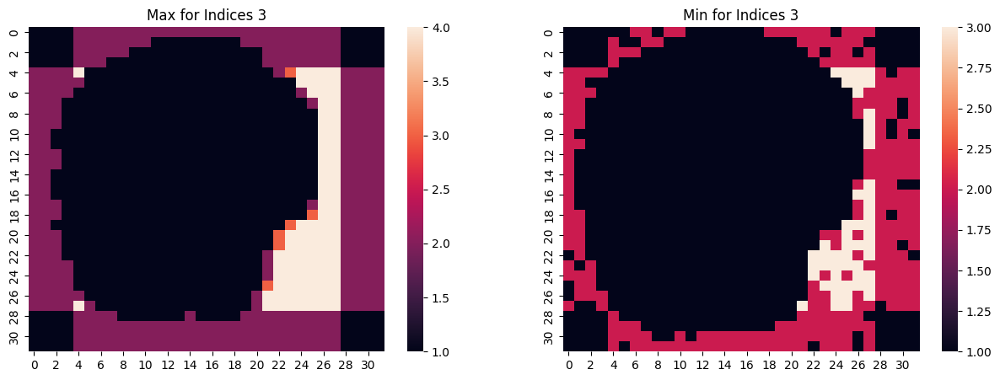

<Figure size 640x480 with 0 Axes>

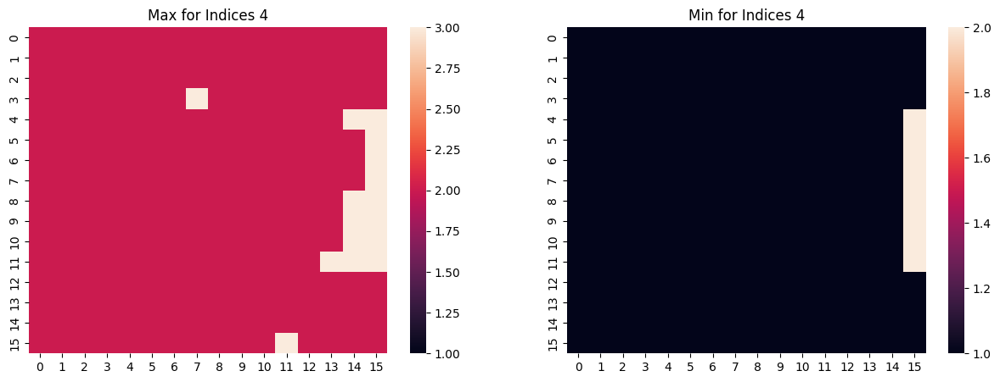

<Figure size 640x480 with 0 Axes>

In [9]:
### REAL PERTURBED INDICES

def count_uniq_idx(perturbed_idx):
    uniq_val = np.zeros_like(perturbed_idx[0,:,:,:])
    # print(uniq_val.shape)

    for c in range(perturbed_idx.shape[-3]):
        for h in range(perturbed_idx.shape[-2]):
            for w in range(perturbed_idx.shape[-1]):
                # print(np.unique(perturbed_idx[:, c, h, w]))
                uniq_val[c,h,w] = len(np.unique(perturbed_idx[:, c, h, w]))

    return uniq_val

for i in range(1,5):
# for i in range(4,5):
    perturbed_idx=[]
    for file in glob.glob(f'/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_indices/*indices{i}*'):
        perturbed_idx.append(pickle.load(open(file, 'rb')).numpy().squeeze())

    perturbed_idx = np.array(perturbed_idx)

    print(perturbed_idx.shape)
    
    # layer_sig = np.std(perturbed_idx, axis=0)
    # # layer_sig = sig.significant_digits(perturbed_idx, reference=np.mean(perturbed_idx, axis=0, dtype=np.float64), method=sig.Method.CNH, basis=10, dtype=np.float64)
    # # layer_sig = sig.significant_digits(indices, reference=np.mean(indices, axis=0), basis=10)
    # norm = TwoSlopeNorm(vmin=layer_sig.min(), vmax=layer_sig.max())

    uniq_val = count_uniq_idx(perturbed_idx)

    fig, axes = plt.subplots(1,2, figsize=(15,5))

    gc = sns.heatmap(np.max(uniq_val, axis=0), vmin=1, ax=axes[0])
    gc.set_title(f'Max for Indices {i}')
    gc = sns.heatmap(np.min(uniq_val, axis=0), vmin=1, ax=axes[1])
    gc.set_title(f'Min for Indices {i}')
    # gc = sns.heatmap(np.mean(layer_sig, axis=0), vmin=0, norm=LogNorm(), cmap='RdYlGn_r', cbar=True)
    plt.figure()


**We now see that indices are variable within the brain, we need to confirm whether that spot in the pooling input is uniform, or potentially so with MCA perturbation**

In [10]:
## GET POOLING INPUT

perturbed_idx=[]
for i in range(1, 11):
    perturbed_idx.append(pickle.load(open(f'/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_encode4/outp_bn3_{i}.pkl', 'rb')).numpy().squeeze())
        # print(file)

perturbed_idx = np.array(perturbed_idx)

print(perturbed_idx.shape)


(10, 71, 32, 32)


In [11]:
def abs_diff(input_array, pool_size, strides, rtol=1e-5):
    channels, input_height, input_width = input_array.shape
    pool_height, pool_width = pool_size
    stride_height, stride_width = strides
    
    # Calculate the output dimensions
    output_height = (input_height - pool_height) // stride_height + 1
    output_width = (input_width - pool_width) // stride_width + 1
    
    # Initialize the output array
    output_array_first = np.zeros((channels, input_height, input_height))
    output_array_second = np.zeros((channels, input_height, input_height))
    output_array_third = np.zeros((channels, input_height, input_height))
    output_array_fourth = np.zeros((channels, input_height, input_height))
    uniq_val = np.zeros((channels, output_height, output_width))
    # idx = np.zeros((channels, output_height, output_width))
    
    # Perform max pooling
    for c in range(channels):
        for i in range(output_height):
            for j in range(output_width):
                # Define the pooling window
                window = input_array[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width]
                

                # check_multi_max = torch.sum(
                #     torch.isclose(window, maxval[:, None, None], rtol=1e-7, equal_nan=True), axis=(1, 2)
                # )
                maxval = np.max(window)

                # uniq_val[c, i, j] = len(np.unique(window.ravel()))
                uniq_val[c, i, j] = np.isclose(window.ravel(), maxval, rtol=rtol, equal_nan=True).sum()
    
                pairwise_abs_diff = np.abs(window.ravel()[:, None] - window.ravel())
                # print(pairwise_abs_diff)
                pairwise_abs_diff = pairwise_abs_diff.reshape(4,2,2)
    
                output_array_first[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[0]
                
                output_array_second[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[1]
    
                output_array_third[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[2]
    
                output_array_fourth[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[3]


    # return output_array_first, output_array_second, output_array_third, output_array_fourth, uniq_val
    return uniq_val


**Single MCA Iteration**

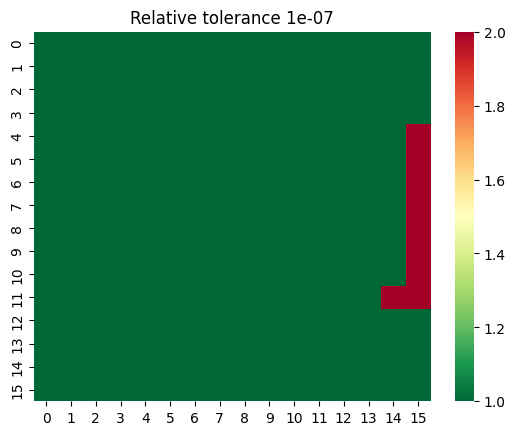

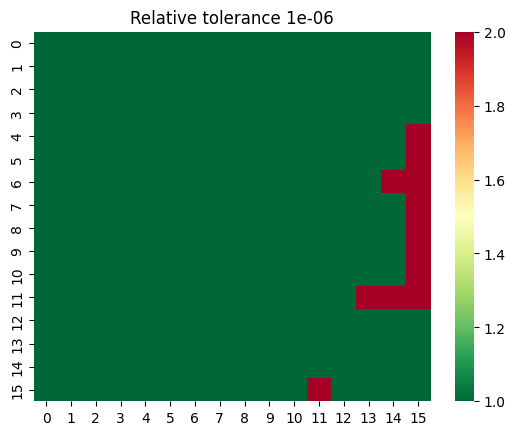

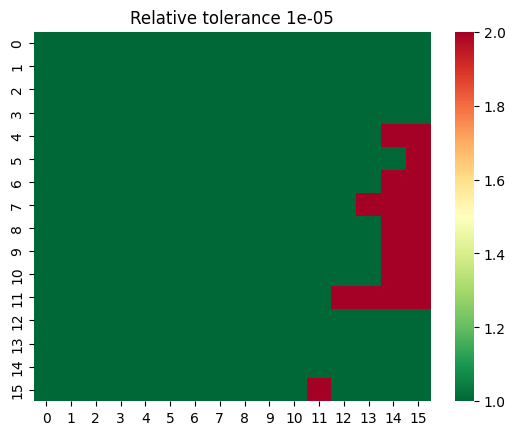

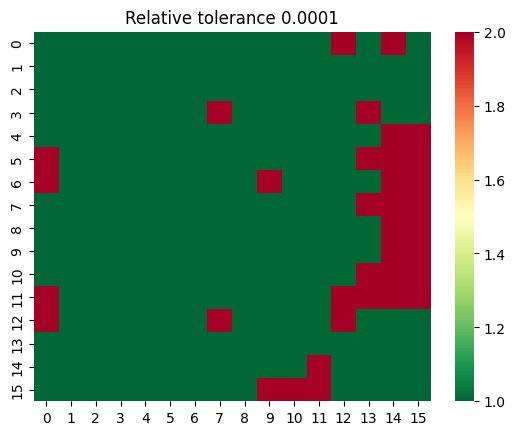

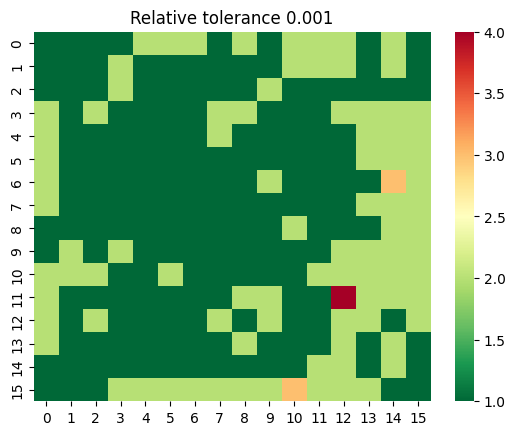

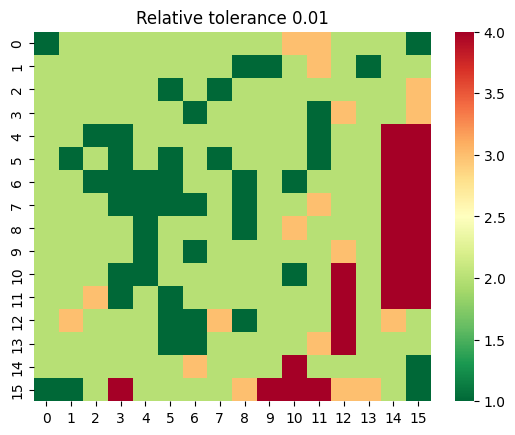

In [12]:
for rtol in [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2]:
    a = abs_diff(perturbed_idx[0].squeeze(), (2,2), (2,2), rtol=rtol)
    gc = sns.heatmap(np.max(a, axis=0), cmap='RdYlGn_r', cbar=True)
    gc.set_title(f'Relative tolerance {rtol}')
    plt.show()


**Max Across All 10 MCA Iterations for Same Pooling Input**

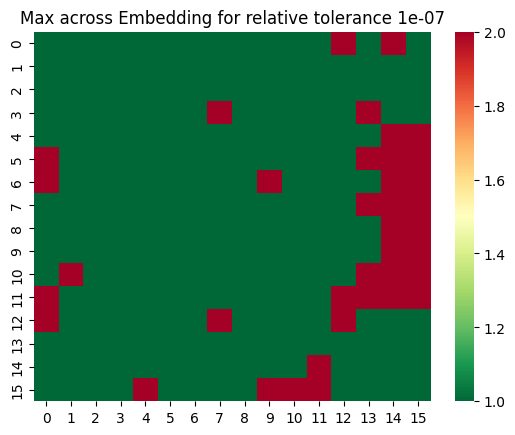

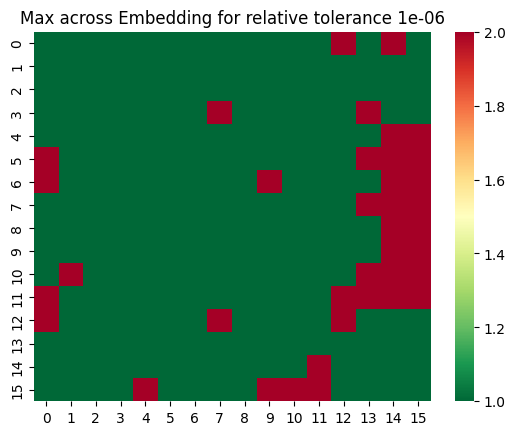

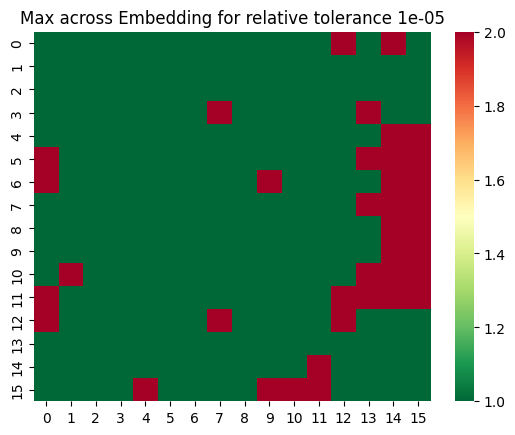

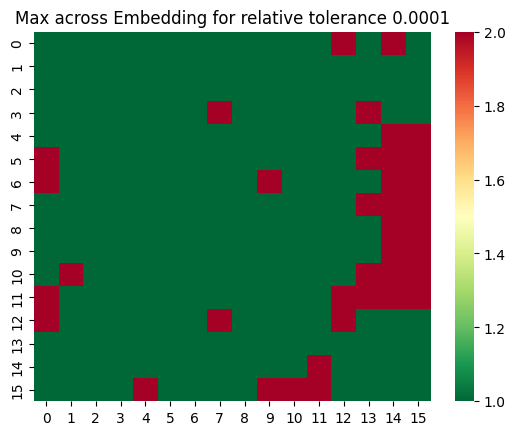

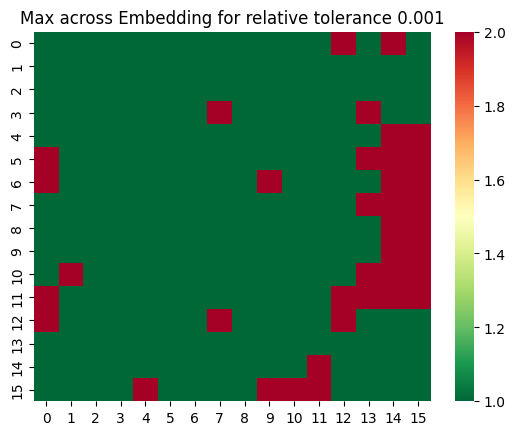

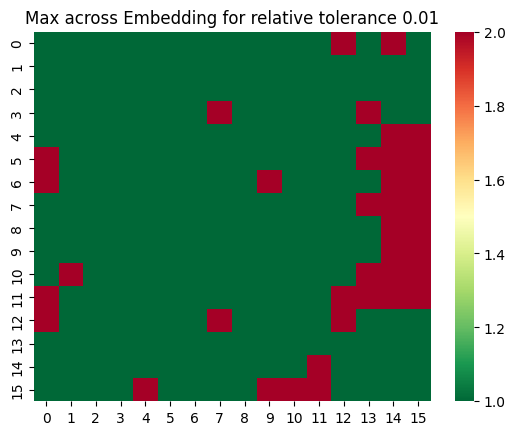

In [13]:
for rtol in [1e-7, 1e-6, 1e-5, 1e-4, 1e-3, 1e-2]:

    encode4_uniform = np.array([abs_diff(perturbed_idx[i].squeeze(), (2,2), (2,2), rtol=1e-4) for i in range(perturbed_idx.shape[0]) ])

    gc = sns.heatmap(np.max(np.max(encode4_uniform, axis=0), axis=0), cmap='RdYlGn_r', cbar=True)
    gc.set_title(f'Max across Embedding for relative tolerance {rtol}')
    plt.show()

### Checking for Repeated Occurrences of Max Values

In [33]:
def max_pooling2d(input_array, pool_size, strides):
    channels, input_height, input_width = input_array.shape
    pool_height, pool_width = pool_size
    stride_height, stride_width = strides
    
    # Calculate the output dimensions
    output_height = (input_height - pool_height) // stride_height + 1
    output_width = (input_width - pool_width) // stride_width + 1
    
    # Initialize the output array
    output_array = np.zeros((channels, output_height, output_width))
    # idx = np.zeros((channels, output_height, output_width))

    # Perform max pooling
    for c in range(channels):
        for i in range(output_height):
            for j in range(output_width):
                # Define the pooling window
                window = input_array[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width]
                # Get the maximum value in the window
                maxval = np.max(window)
                if np.where(window == maxval)[0].shape[0] > 1:
                    print(window)
                    print(c, i, j, np.where(input_array[c, :, :] == maxval), np.where(input_array[c, :, :] == maxval)[0].shape[0], maxval )
                output_array[c, i, j] = maxval
        # break
    
    return output_array


for i in pool_input:
    #     print(i.shape)
    a = max_pooling2d(pool_input[0], (2,2), (2,2))
    print()
    break

[[ 0.31382796 -4.6614056 ]
 [ 0.31382796 -4.6614122 ]]
33 6 15 (array([12, 13]), array([30, 30])) 2 0.31382796
[[-7.62284  -7.173526]
 [-7.622818 -7.173526]]
38 11 14 (array([22, 23]), array([29, 29])) 2 -7.173526
[[-7.168602  -6.445777 ]
 [-7.1685977 -6.445777 ]]
41 11 15 (array([22, 23]), array([31, 31])) 2 -6.445777
[[-3.2568145  5.6936693]
 [-3.2568088  5.6936693]]
43 5 15 (array([10, 11]), array([31, 31])) 2 5.6936693
[[-7.506973  -3.9893854]
 [-7.506983  -3.9893854]]
45 8 15 (array([ 9, 16, 17]), array([31, 31, 31])) 3 -3.9893854
[[3.4982514 2.439342 ]
 [3.4982514 2.43934  ]]
46 9 15 (array([11, 18, 19]), array([30, 30, 30])) 3 3.4982514
[[0.8641539 1.1082603]
 [0.8641544 1.1082603]]
46 11 14 (array([22, 23]), array([29, 29])) 2 1.1082603
[[-0.9731924  -0.62580746]
 [-0.9731933  -0.62580746]]
51 11 15 (array([22, 23]), array([31, 31])) 2 -0.62580746
[[-4.3177075  1.4963772]
 [-4.3177104  1.4963772]]
63 7 15 (array([14, 15]), array([31, 31])) 2 1.4963772
[[-3.2026942 -5.286178 ]
 

### Identifying Uniformity of Background

In [48]:
def abs_diff(input_array, pool_size, strides):
    channels, input_height, input_width = input_array.shape
    pool_height, pool_width = pool_size
    stride_height, stride_width = strides
    
    # Calculate the output dimensions
    output_height = (input_height - pool_height) // stride_height + 1
    output_width = (input_width - pool_width) // stride_width + 1
    
    # Initialize the output array
    output_array_first = np.zeros((channels, input_height, input_height))
    output_array_second = np.zeros((channels, input_height, input_height))
    output_array_third = np.zeros((channels, input_height, input_height))
    output_array_fourth = np.zeros((channels, input_height, input_height))
    uniq_val = np.zeros((channels, output_height, output_width))
    # idx = np.zeros((channels, output_height, output_width))
    
    # Perform max pooling
    for c in range(channels):
        for i in range(output_height):
            for j in range(output_width):
                # Define the pooling window
                window = input_array[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width]
                
                uniq_val[c, i, j] = len(np.unique(window.ravel()))
    
                pairwise_abs_diff = np.abs(window.ravel()[:, None] - window.ravel())
                # print(pairwise_abs_diff)
                pairwise_abs_diff = pairwise_abs_diff.reshape(4,2,2)
    
                output_array_first[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[0]
                
                output_array_second[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[1]
    
                output_array_third[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[2]
    
                output_array_fourth[c, i * stride_height:i * stride_height + pool_height,
                                     j * stride_width:j * stride_width + pool_width] = pairwise_abs_diff[3]


    # return output_array_first, output_array_second, output_array_third, output_array_fourth, uniq_val
    return uniq_val




print('Sample window')
print(pool_input[0, 20, 12:14, -2:])
print('\nFlattened sample window')
print(pool_input[0, 20, 12:14, -2:].ravel())
pairwise_abs_diff = np.abs(pool_input[0, 20, 12:14, -2:].ravel()[:, None] - pool_input[0, 20, 12:14, -2:].ravel())
print('\nFlattened pairwise differences for each value in window')
print(pairwise_abs_diff)
pairwise_abs_diff.reshape(4,2,2)

pairwise_diff = []
uniq_val = []
for i in range(len(pool_input)):
    # pairwise_diff.append( abs_diff(pool_input[i], (2,2), (2,2)) )
    uniq_val.append( abs_diff(pool_input[i], (2,2), (2,2)) )

# pairwise_diff = np.array(pairwise_diff)

Sample window
[[-5.095098 -5.048476]
 [-5.0951   -5.04848 ]]

Flattened sample window
[-5.095098 -5.048476 -5.0951   -5.04848 ]

Flattened pairwise differences for each value in window
[[0.0000000e+00 4.6621799e-02 1.9073486e-06 4.6617985e-02]
 [4.6621799e-02 0.0000000e+00 4.6623707e-02 3.8146973e-06]
 [1.9073486e-06 4.6623707e-02 0.0000000e+00 4.6619892e-02]
 [4.6617985e-02 3.8146973e-06 4.6619892e-02 0.0000000e+00]]


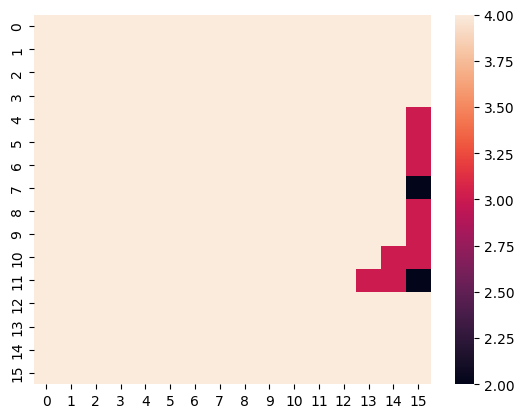

In [51]:
uniq_val = np.array(uniq_val)
uniq_val.shape

gc = sns.heatmap(np.min(np.min(uniq_val, axis=0), axis=0))

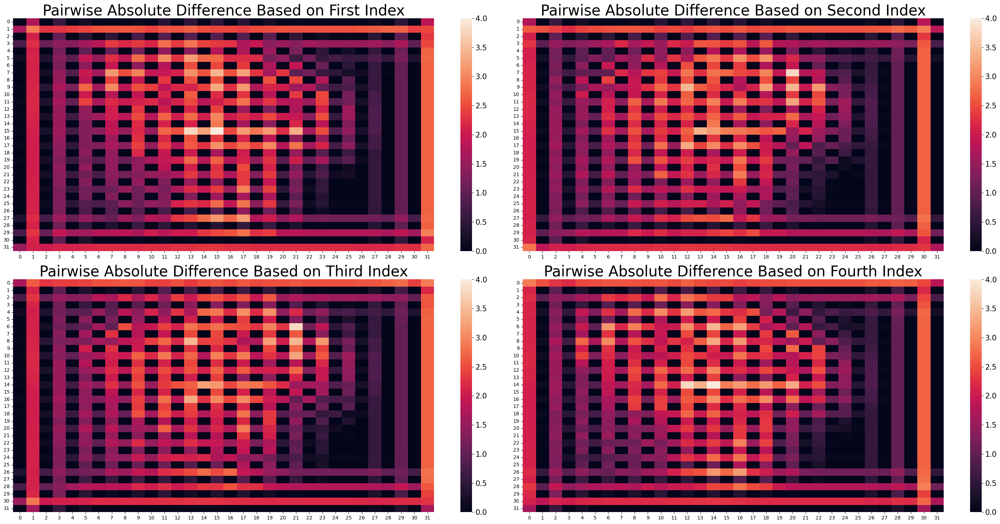

In [18]:
mean_diff = np.mean(pairwise_diff, axis=0)

fig, axes = plt.subplots(2, 2, figsize=(30,15))
gc = sns.heatmap(np.mean(mean_diff[0], axis=0), ax=axes[0,0], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on First Index',fontsize=30)
cax = axes[0,0].figure.axes[-1]
cax.tick_params(labelsize=15)
gc=sns.heatmap(np.mean(mean_diff[1], axis=0), ax=axes[0,1], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on Second Index',fontsize=30)
cax = axes[0,1].figure.axes[-1]
cax.tick_params(labelsize=15)
gc=sns.heatmap(np.mean(mean_diff[2], axis=0), ax=axes[1,0], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on Third Index',fontsize=30)
cax = axes[1,0].figure.axes[-1]
cax.tick_params(labelsize=15)
gc=sns.heatmap(np.mean(mean_diff[3], axis=0), ax=axes[1,1], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on Fourth Index',fontsize=30);
cax = axes[1,1].figure.axes[-1]
cax.tick_params(labelsize=15)
plt.tight_layout()



Encode 2 Block


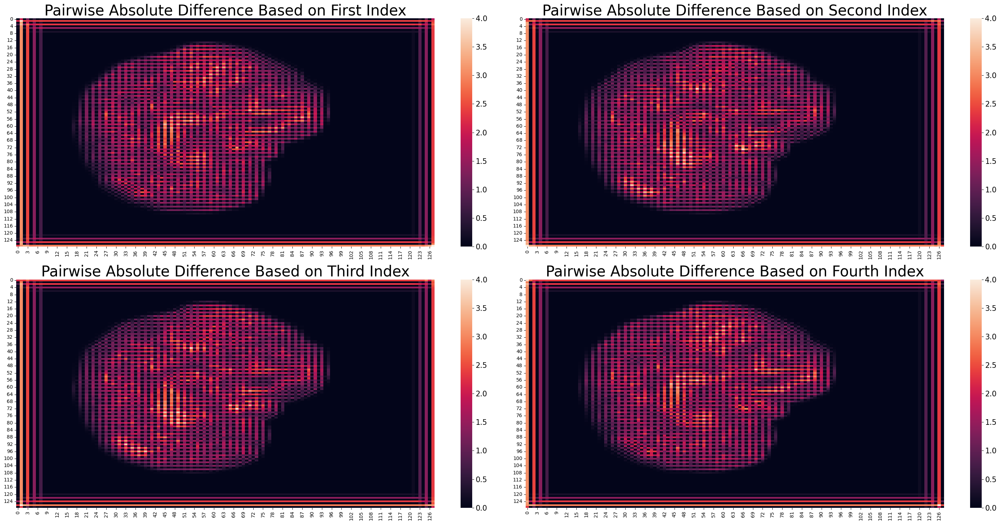

In [23]:
mean_diff = np.mean(pairwise_diff, axis=0)

fig, axes = plt.subplots(2, 2, figsize=(30,15))
gc = sns.heatmap(np.mean(mean_diff[0], axis=0), ax=axes[0,0], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on First Index',fontsize=30)
cax = axes[0,0].figure.axes[-1]
cax.tick_params(labelsize=15)
gc=sns.heatmap(np.mean(mean_diff[1], axis=0), ax=axes[0,1], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on Second Index',fontsize=30)
cax = axes[0,1].figure.axes[-1]
cax.tick_params(labelsize=15)
gc=sns.heatmap(np.mean(mean_diff[2], axis=0), ax=axes[1,0], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on Third Index',fontsize=30)
cax = axes[1,0].figure.axes[-1]
cax.tick_params(labelsize=15)
gc=sns.heatmap(np.mean(mean_diff[3], axis=0), ax=axes[1,1], vmin=0, vmax=4)
gc.set_title('Pairwise Absolute Difference Based on Fourth Index',fontsize=30);
cax = axes[1,1].figure.axes[-1]
cax.tick_params(labelsize=15)
plt.tight_layout()

print('Encode 2 Block')

## Check If Multi Threading is Issue
It is not

### Embedding Layers -- single threaded

(10, 32, 256, 256)
(10, 71, 128, 128)
(10, 71, 64, 64)
(10, 71, 32, 32)
(10, 71, 16, 16)
(10, 71, 16, 16)
(10, 71, 32, 32)
(10, 71, 64, 64)
(10, 71, 128, 128)
(10, 71, 256, 256)


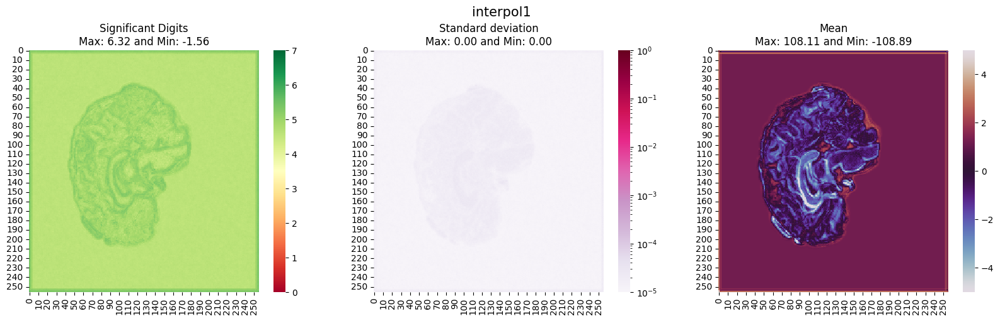

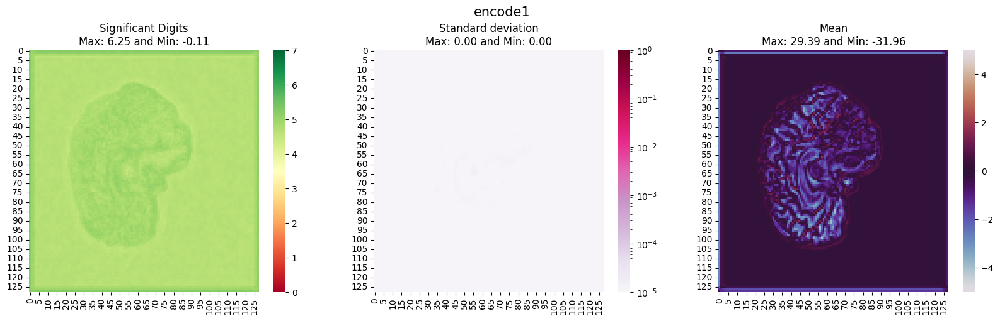

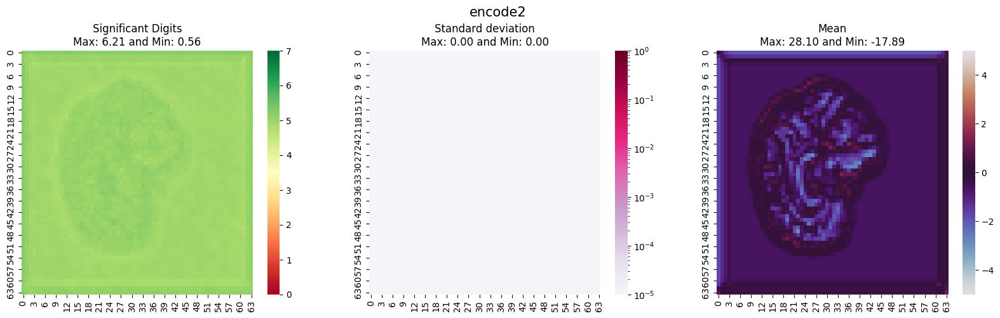

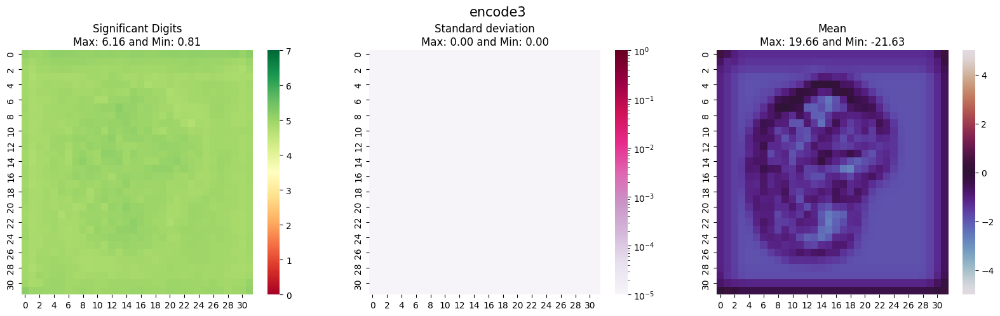

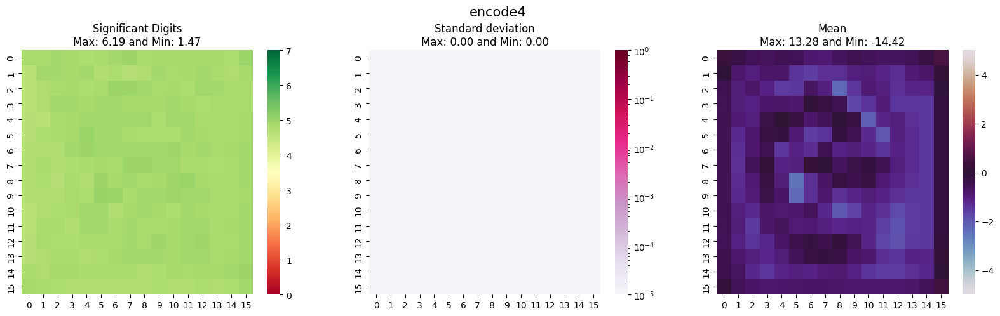

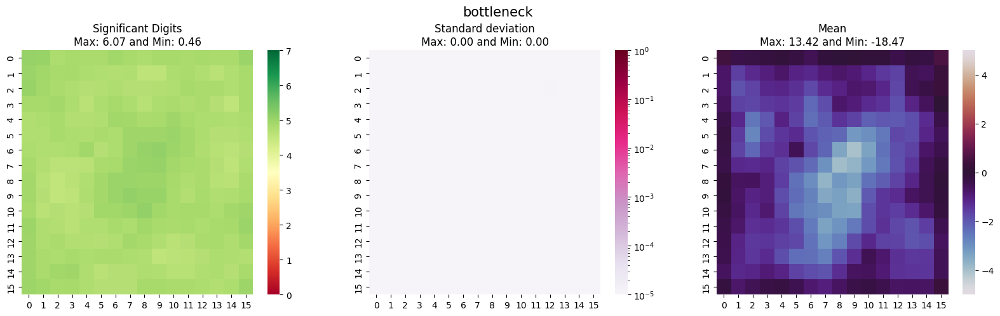

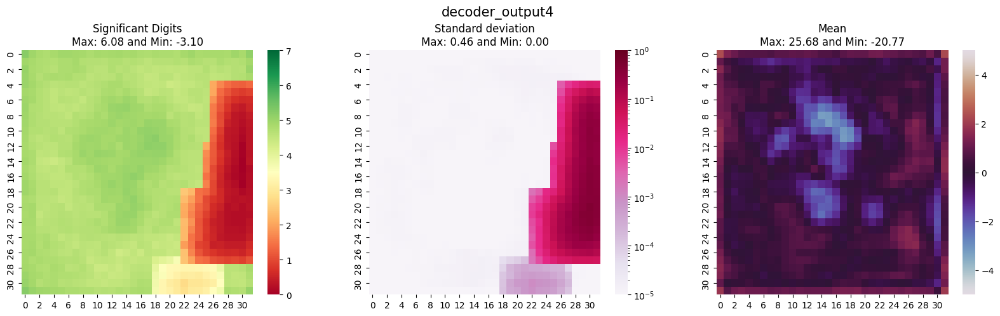

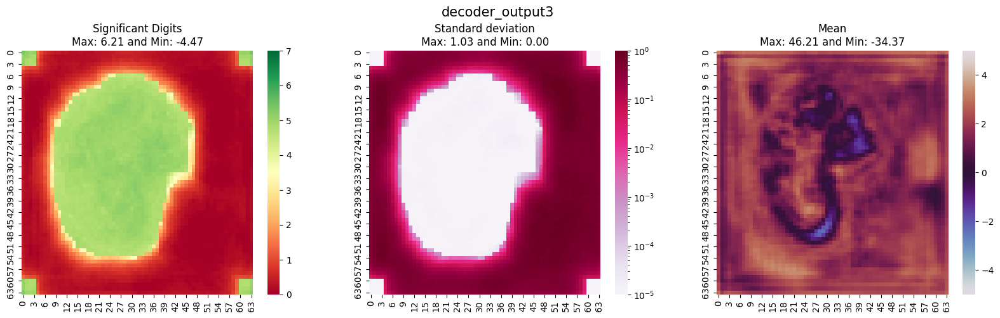

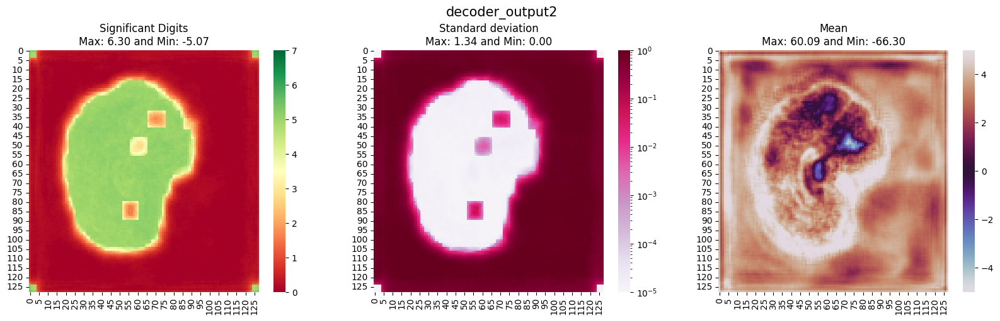

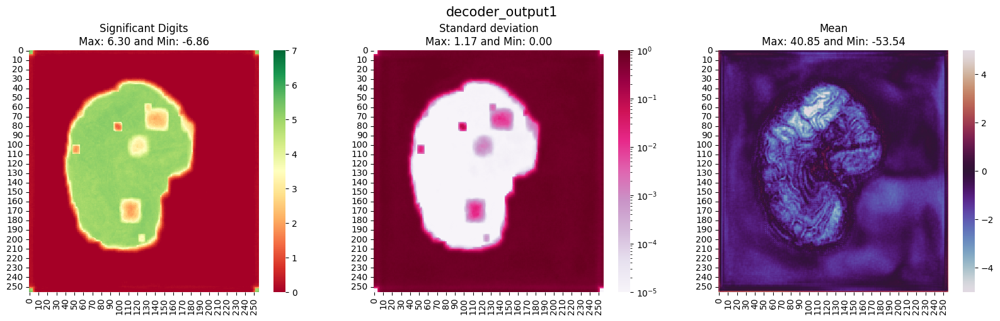

In [ ]:
# analyze_embeddings(['inp_block', 'interpol1', 'encode1', 'encode2', 'encode3', 'encode4', 'bottleneck', 'decode4', 'decode3', 'decode2', 'decode1', 'interpol2', 'outp_block', 'classifier'], 
analyze_embeddings(['interpol1', 'encode1', 'encode2', 'encode3', 'encode4', 'bottleneck', 'decoder_output4', 'decoder_output3', 'decoder_output2', 'decoder_output1'], 
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_singlethread_sagittal/', dict_type=False, colormap='PuRd', std_vmax=1, std_vmin=10e-6, mean_vmin=-5, mean_vmax=5)

### Embedding Layers -- multi threaded

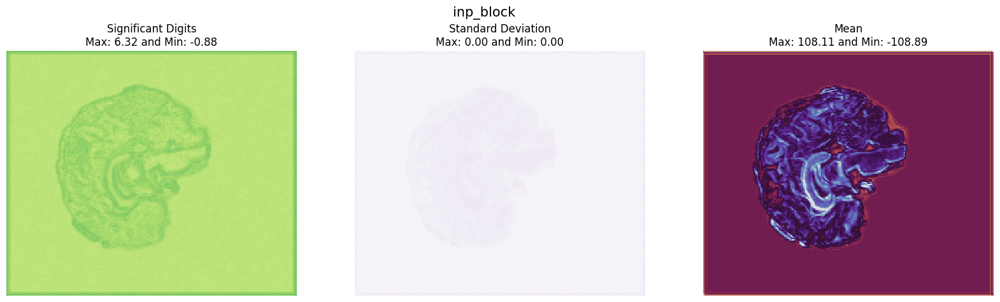

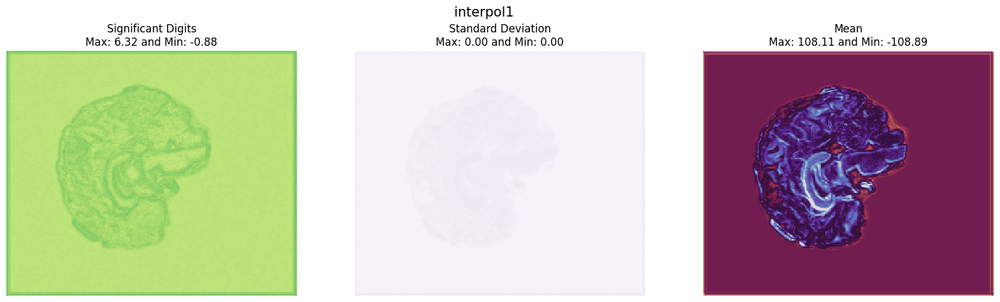

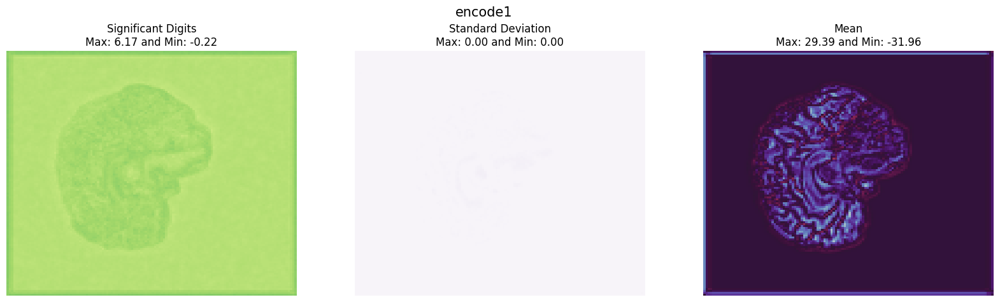

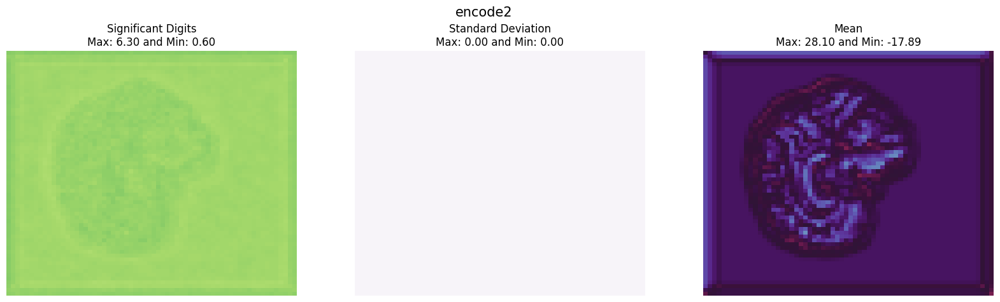

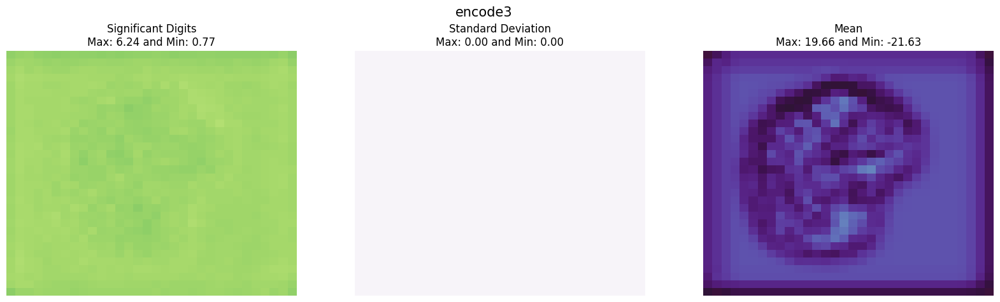

...

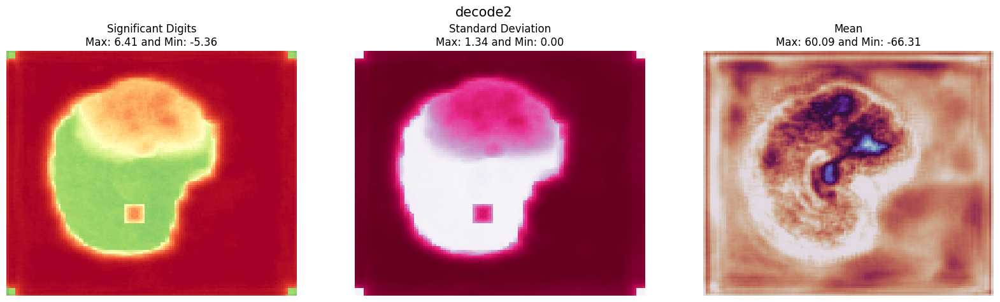

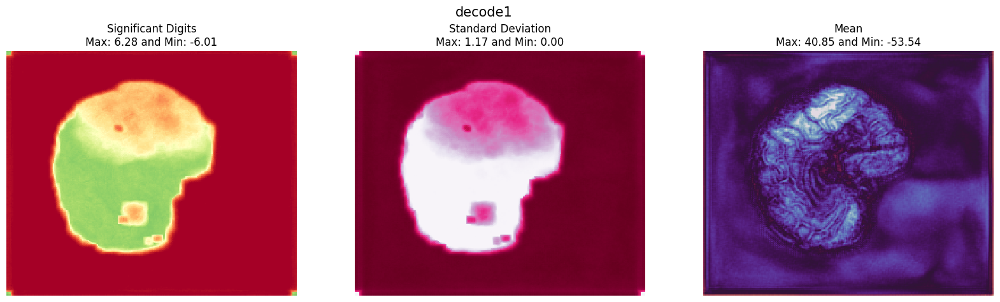

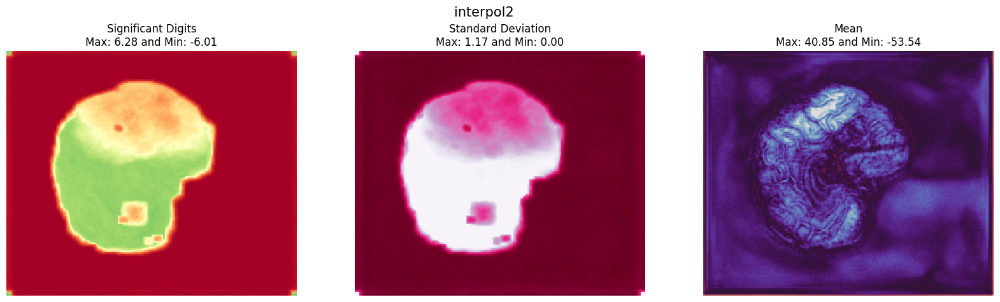

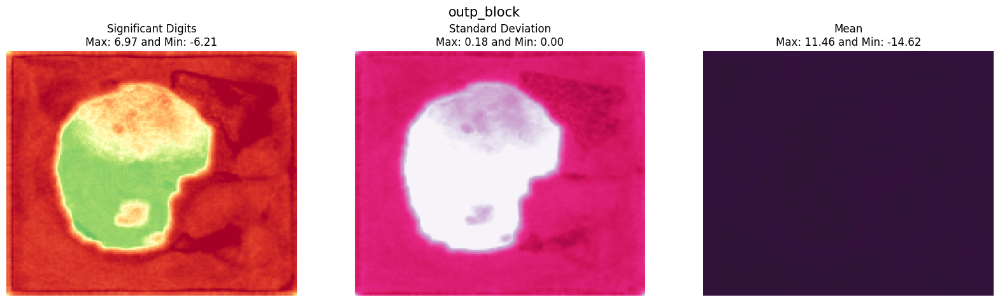

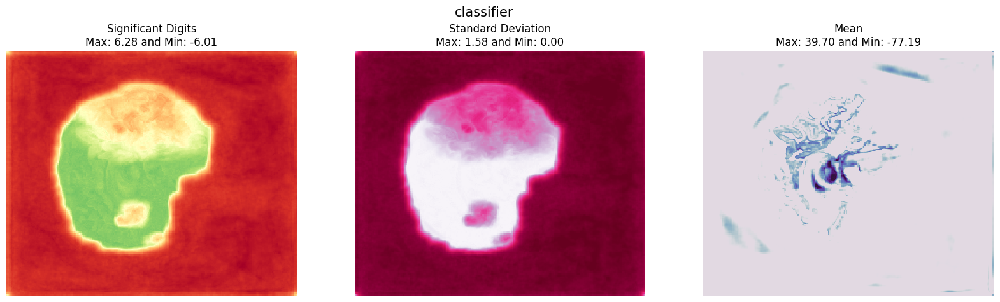

In [ ]:
analyze_embeddings(['inp_block', 'interpol1', 'encode1', 'encode2', 'encode3', 'encode4', 'bottleneck', 'decode4', 'decode3', 'decode2', 'decode1', 'interpol2', 'outp_block', 'classifier'], 
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_sagittal2/', dict_type=False, colormap='PuRd', std_vmax=1, std_vmin=10e-6, mean_vmin=-5, mean_vmax=5)

### Torch Single Thread Parallelism

(10, 71, 16, 16)


/home/ine5/jupyter_nb/lib/python3.10/site-packages/significantdigits/_significantdigits.py:257: RuntimeWarning: invalid value encountered in divide
  return operator(x, y_reshaped)


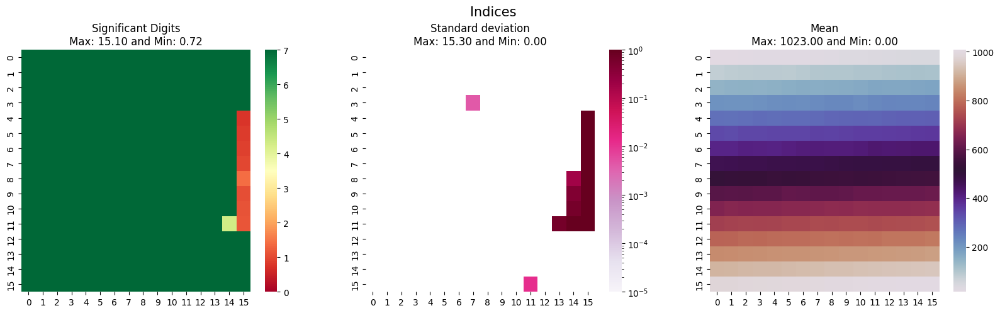

In [13]:
layers = []

for file in glob.glob(f'/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_decode4_torchthread/*indices4*'):
    layers.append(pickle.load(open(file, 'rb')).squeeze())
   
layers = np.array(layers, dtype=np.float64)

print(layers.shape)

fig, axes = plt.subplots(1, 3, figsize=(20,5))

layer_sig = sig.significant_digits(layers, reference=np.mean(layers, axis=0, dtype=np.float64), method=sig.Method.CNH, basis=10, dtype=np.float64)
# print(layer_sig.shape)
gc = sns.heatmap(np.mean(layer_sig, axis=0, dtype=np.float64), ax=axes[0], vmin=0, vmax=7, cmap='RdYlGn', cbar=True)
gc.set_title(f"Significant Digits\nMax: {np.max(layer_sig):.2f} and Min: {np.min(layer_sig):.2f}")

layer_std = np.std(layers, axis=0,dtype=np.float64)
layer_std = np.mean(layer_std, axis=0,dtype=np.float64)
gc = sns.heatmap(layer_std, ax=axes[1], cmap='PuRd', norm=LogNorm(vmax=1, vmin=10e-6), cbar=True)
gc.set_title(f"Standard deviation\nMax: {np.max(layer_std,):.2f} and Min: {np.min(layer_std):.2f}");

layer_mean = np.mean(layers, axis=0,dtype=np.float64)
# norm = TwoSlopeNorm(vmin=layer_mean.min()/2, vcenter=0, vmax=layer_mean.max()/2)

gc = sns.heatmap(np.mean(layer_mean, axis=0,dtype=np.float64), ax=axes[2], cmap='twilight', cbar=True)


# gc.axes.get_yaxis().set_visible(False), gc.axes.get_xaxis().set_visible(False)
gc.set_title(f"Mean\nMax: {np.max(layer_mean):.2f} and Min: {np.min(layer_mean):.2f}");
plt.suptitle(f"Indices\n", y=1.02, fontsize=15);


### IEEE Parallelism Check

#### Block Layers Multi Threaded

(10, 71, 128, 128)
(10, 71, 64, 64)
(10, 71, 32, 32)
(10, 71, 16, 16)
(10, 71, 16, 16)
(10, 71, 32, 32)
(10, 71, 64, 64)
(10, 71, 128, 128)
(10, 71, 256, 256)
(10, 71, 256, 256)
(10, 51, 256, 256)
encode1
encode2
encode3
encode4
bottleneck
decoder_output4
decoder_output3
decoder_output2
decoder_output1
outp_block
classifier


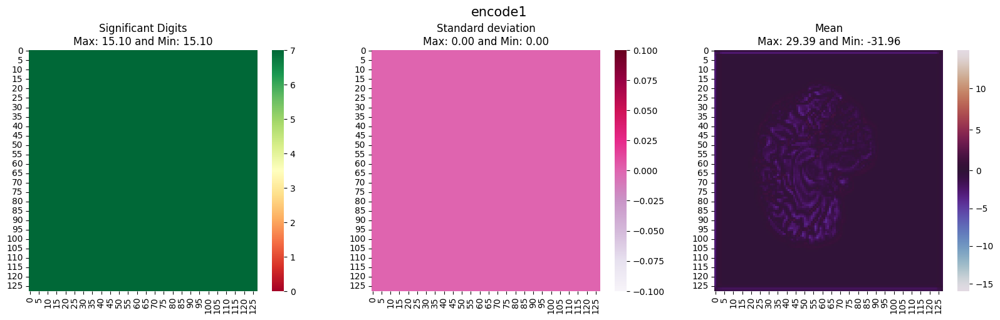

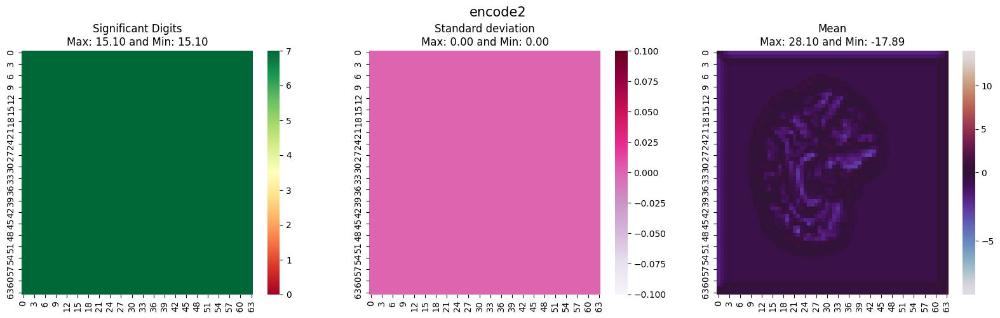

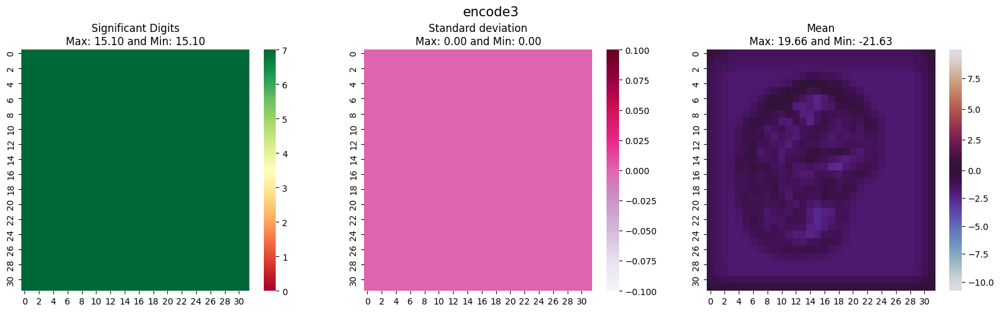

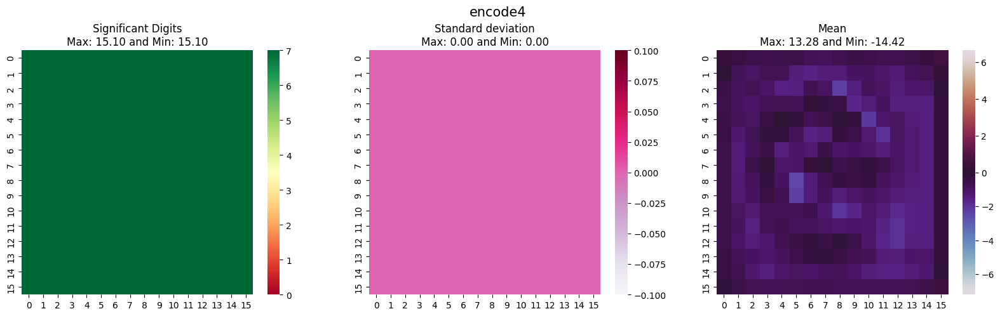

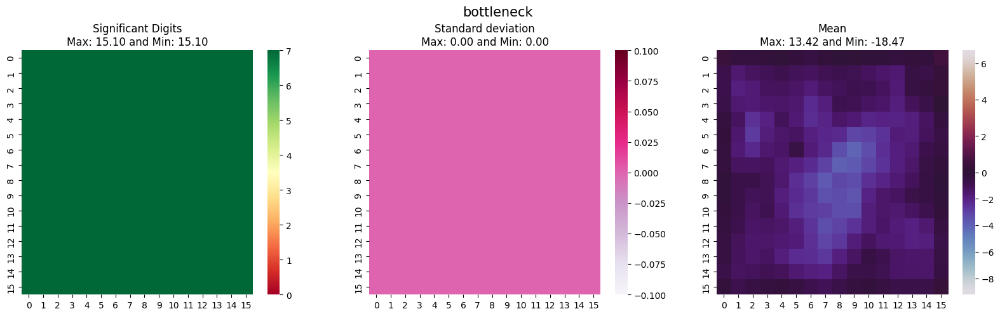

...

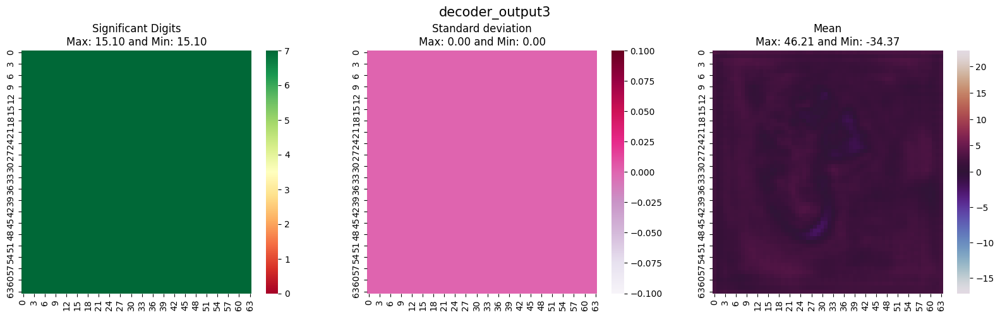

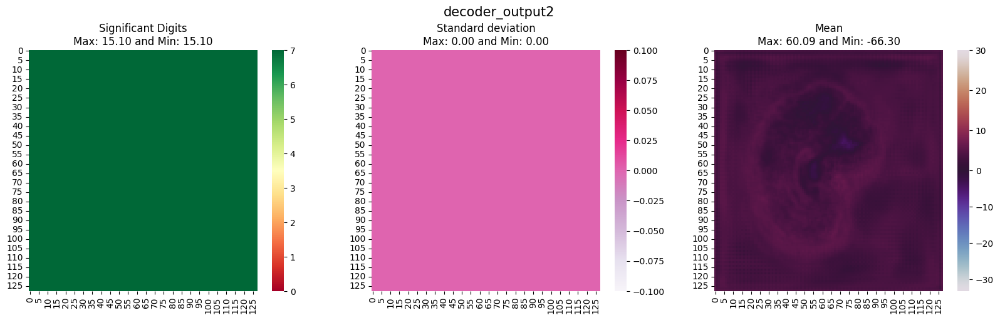

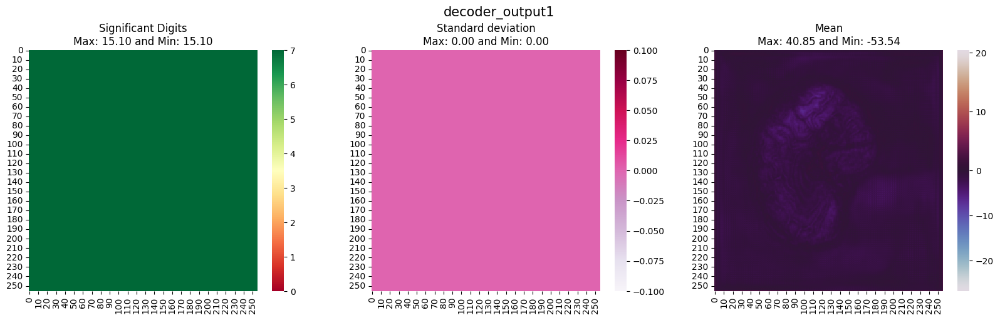

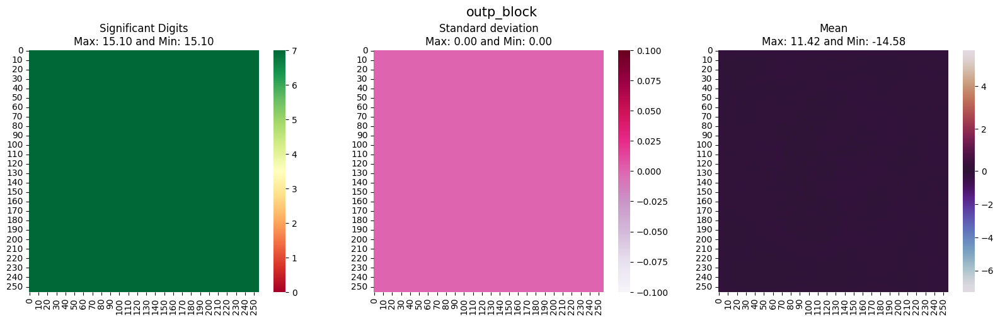

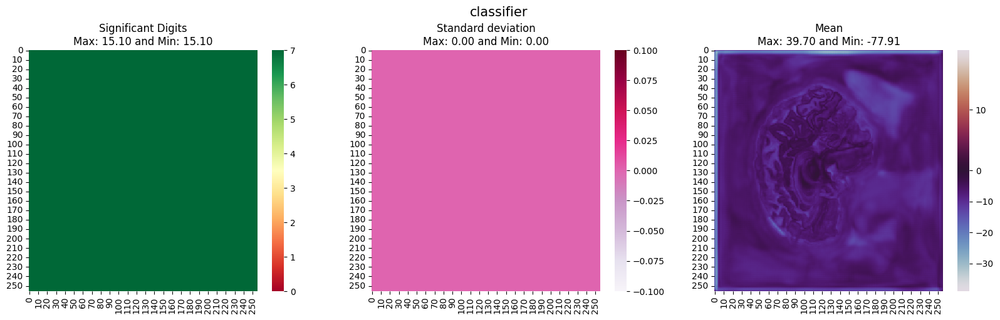

In [17]:
analyze_embeddings(['encode1', 'encode2', 'encode3', 'encode4', 'bottleneck', 'decoder_output4', 'decoder_output3', 'decoder_output2', 'decoder_output1', 'outp_block', 'classifier'], 
# analyze_embeddings(['unpool', 'concatmax','prelu0', 'conv0', 'bn0', 'maxadd0', 'prelu1', 'conv1', 'bn1', 'maxadd1', 'prelu2', 'conv2', 'bn2', 'maxadd2', 'prelu3', 'conv3', 'bn3'],
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_parallel_multi/', dict_type=False, colormap='PuRd') #, std_vmax=0.015, mean_vmin=-10, mean_vmax=0)

#### Block Layers Single threaded

(10, 71, 128, 128)
(10, 71, 64, 64)
(10, 71, 32, 32)
(10, 71, 16, 16)
(10, 71, 16, 16)
(10, 71, 32, 32)
(10, 71, 64, 64)
(10, 71, 128, 128)
(10, 71, 256, 256)
(10, 71, 256, 256)
(10, 51, 256, 256)
encode1
encode2
encode3
encode4
bottleneck
decoder_output4
decoder_output3
decoder_output2
decoder_output1
outp_block
classifier


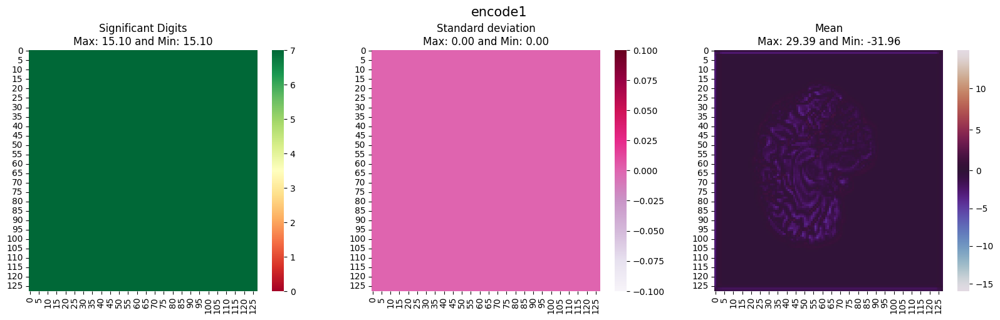

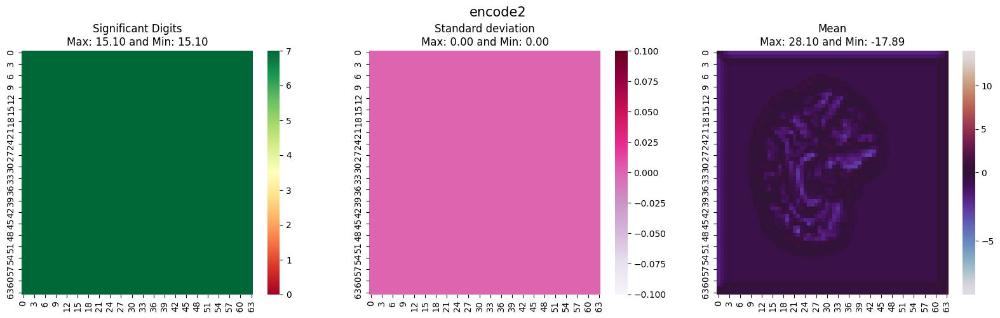

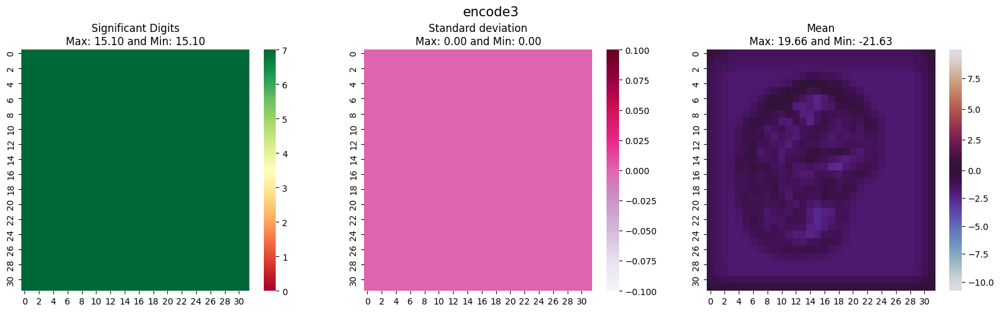

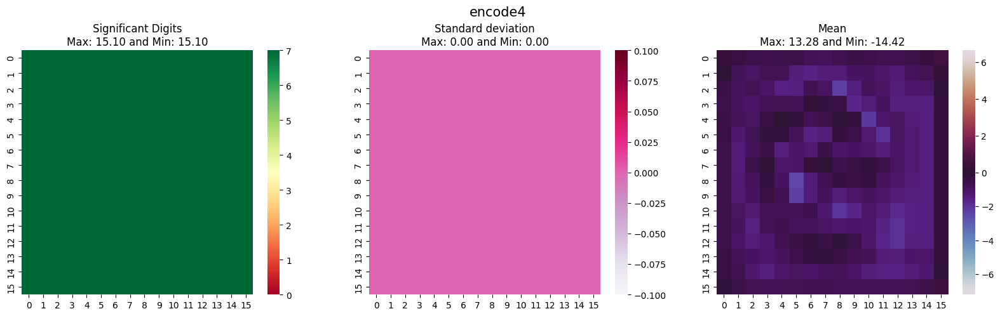

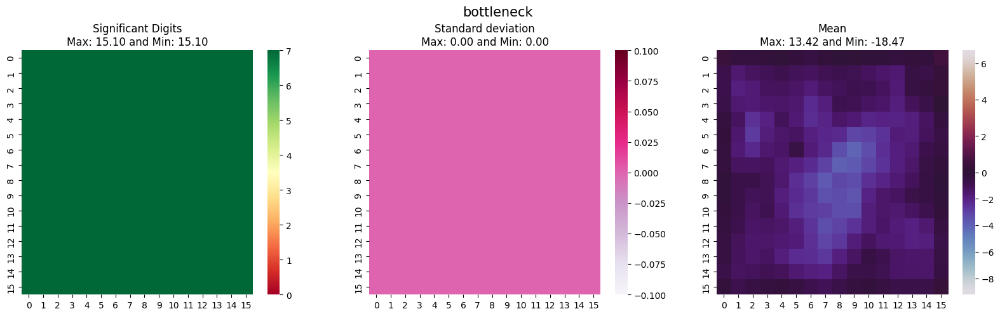

...

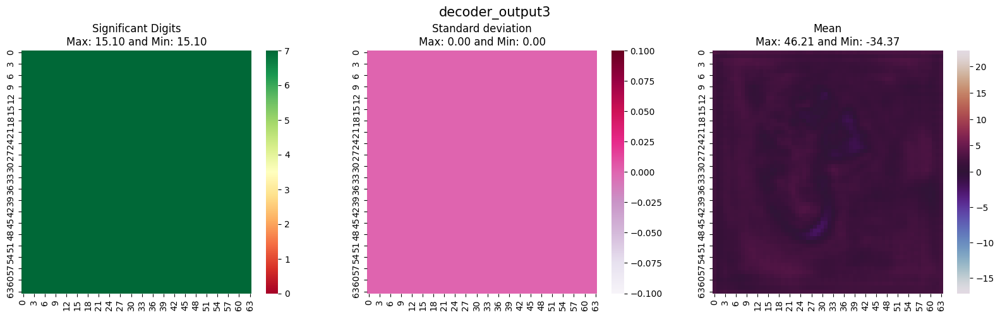

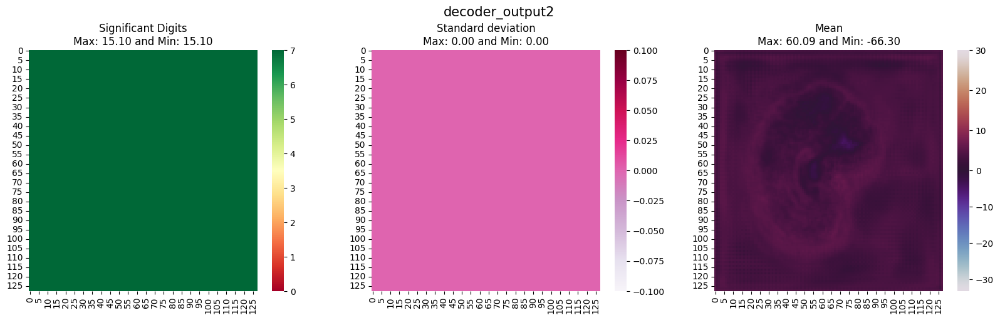

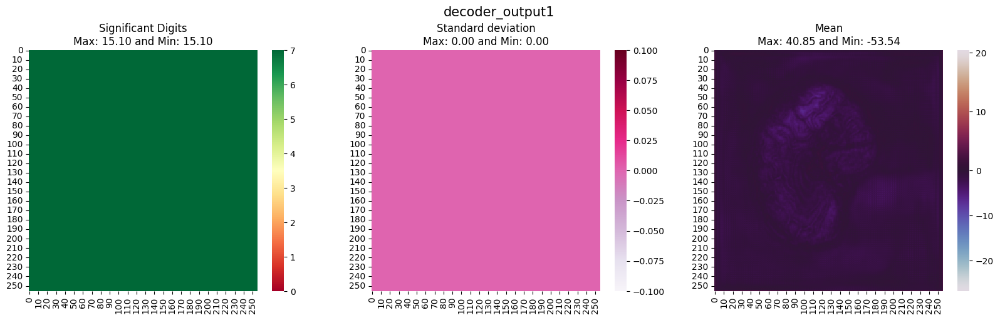

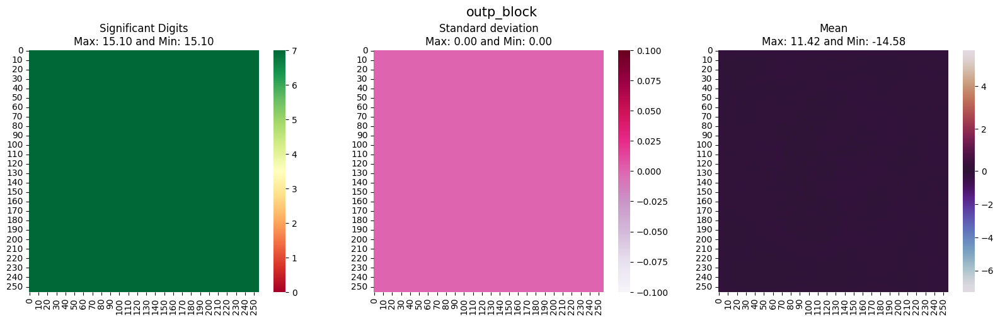

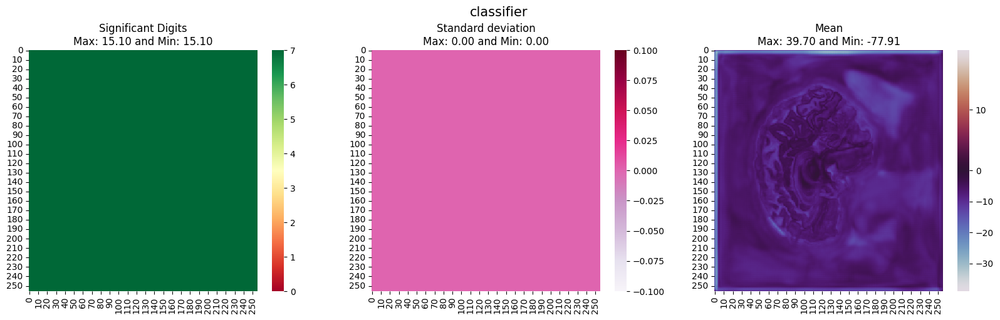

In [16]:
analyze_embeddings(['encode1', 'encode2', 'encode3', 'encode4', 'bottleneck', 'decoder_output4', 'decoder_output3', 'decoder_output2', 'decoder_output1', 'outp_block', 'classifier'], 
# analyze_embeddings(['unpool', 'concatmax','prelu0', 'conv0', 'bn0', 'maxadd0', 'prelu1', 'conv1', 'bn1', 'maxadd1', 'prelu2', 'conv2', 'bn2', 'maxadd2', 'prelu3', 'conv3', 'bn3'],
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_parallel_single/', dict_type=False, colormap='PuRd') #, std_vmax=0.015, mean_vmin=-10, mean_vmax=0)

## Sample subject sub-0025531, like others only has instability appear in Decoder not in Encoder or Skip Connections

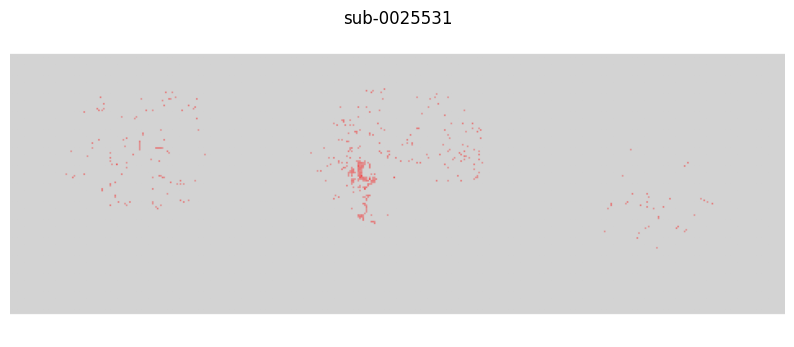

In [8]:
plt.figure(figsize=(10,5))
img = mpimg.imread('/home/ine5/projects/def-glatard/ine5/entropy_maps/fast_img/0025531.png')
imgplot = plt.imshow(img)
plt.axis('off')
plt.title('sub-0025531');

### Encode2 Layer

(10, 71, 64, 64)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
(10, 71, 128, 128)
pool
prelu0
conv0
bn0
maxadd0
prelu1
conv1
bn1
maxadd1
prelu2
conv2
bn2
maxadd2
prelu3
conv3
bn3


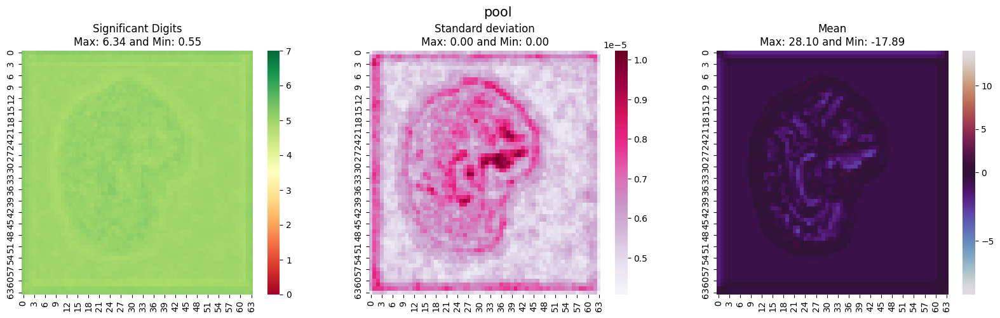

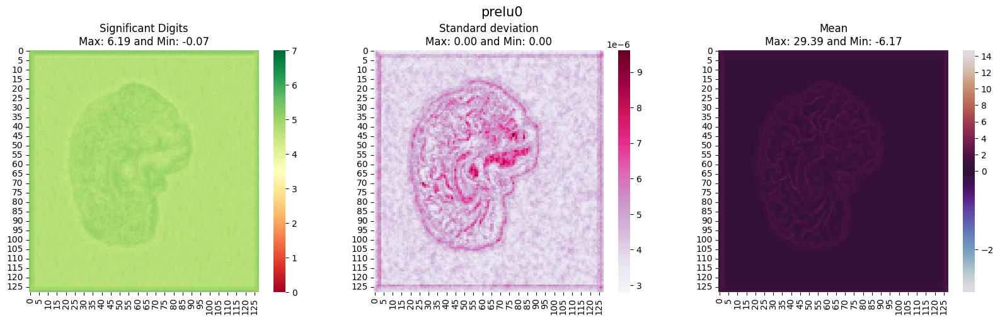

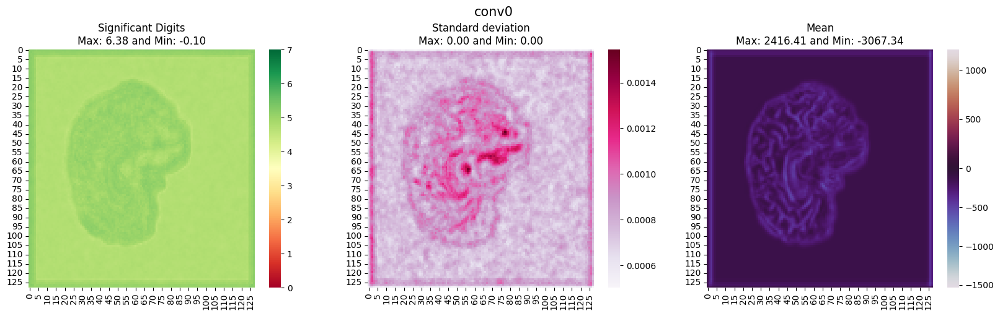

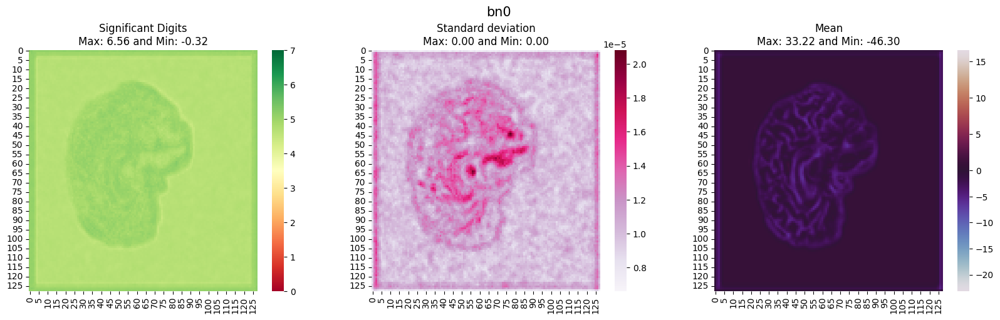

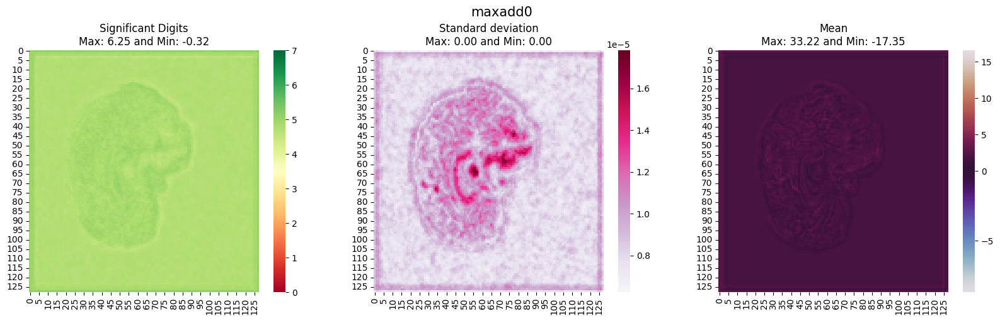

...

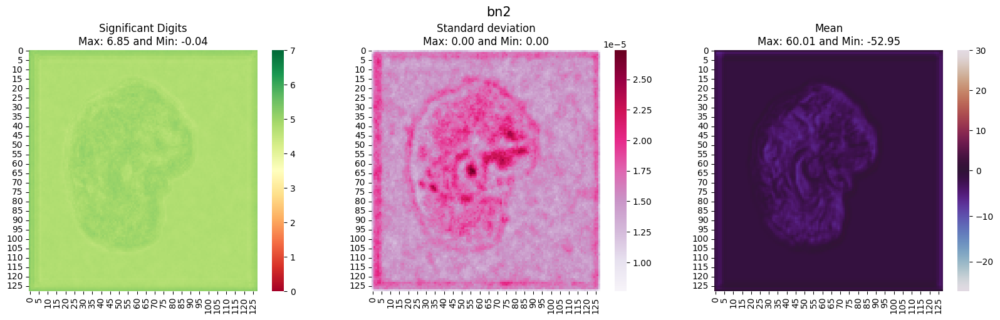

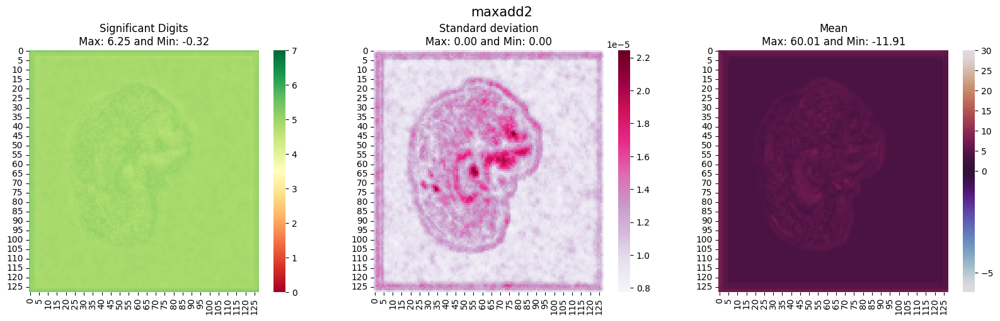

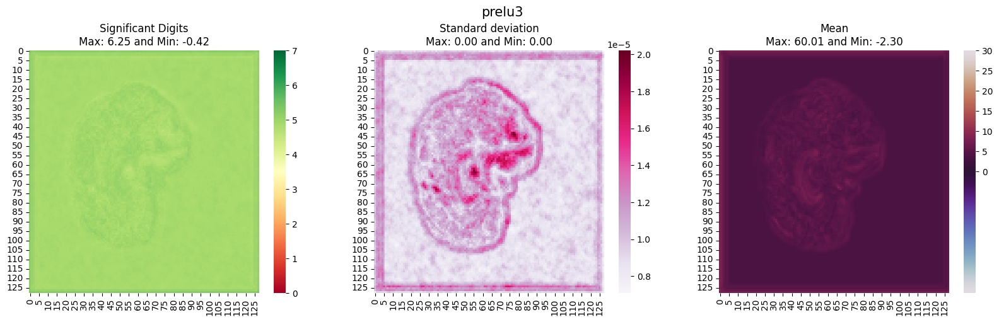

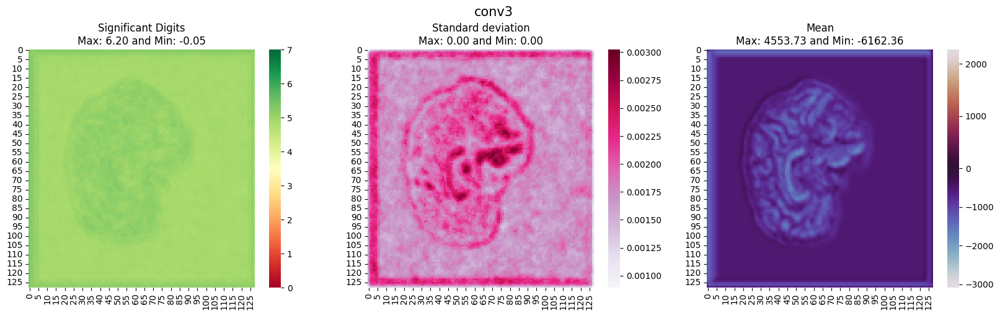

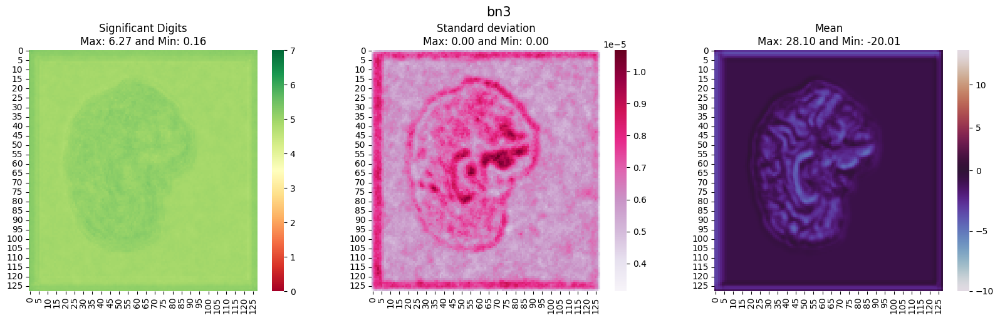

In [25]:
analyze_embeddings(['pool','prelu0', 'conv0', 'bn0', 'maxadd0', 'prelu1', 'conv1', 'bn1', 'maxadd1', 'prelu2', 'conv2', 'bn2', 'maxadd2', 'prelu3', 'conv3', 'bn3'],
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_encode2/', dict_type=False, colormap='PuRd') #, std_vmax=0.015, mean_vmin=-10, mean_vmax=0)

### Skip Connections

(10, 71, 256, 256)
(10, 71, 128, 128)
(10, 71, 64, 64)
(10, 71, 32, 32)


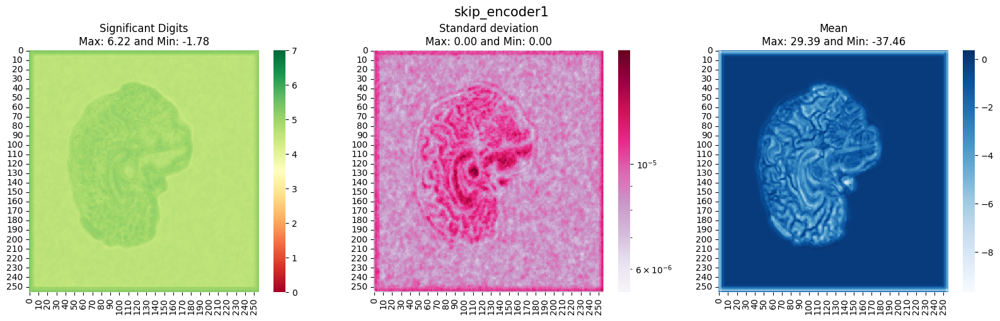

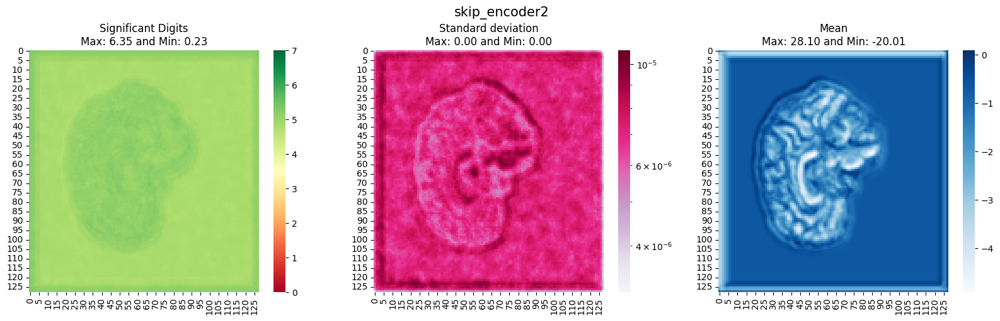

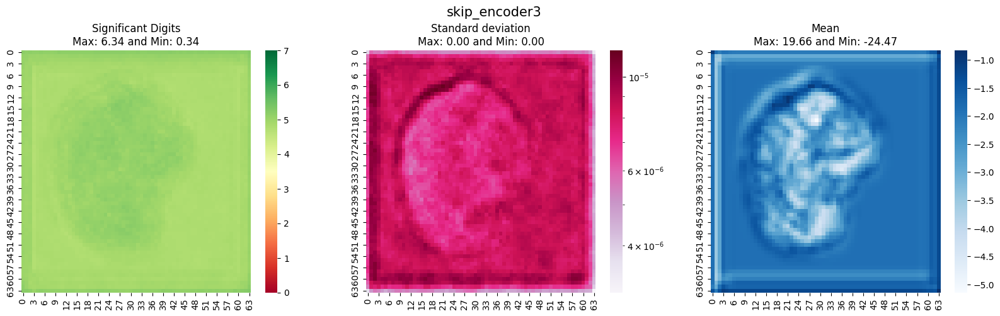

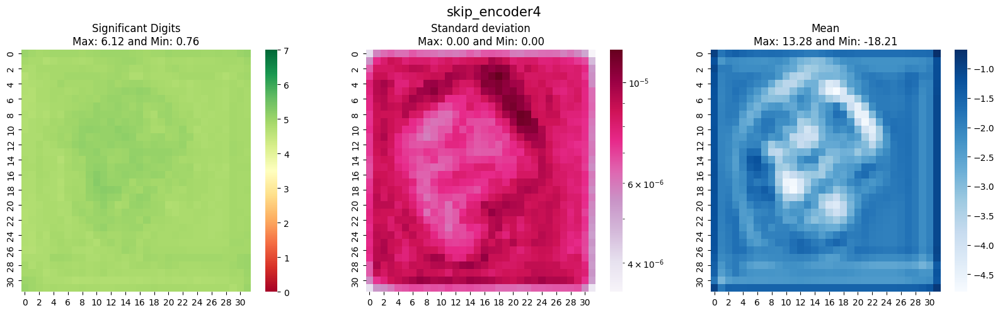

In [8]:
analyze_embeddings(['skip_encoder1', 'skip_encoder2','skip_encoder3', 'skip_encoder4'],
                   '/scratch/ine5/fastsurfer_embeddings/results/sub-0025531_skip/', dict_type=False, colormap='PuRd') #, std_vmax=0.015, mean_vmin=-10, mean_vmax=0)